#Acea Smart Water Analytics

---

© Explore Data Science Academy

---

In [0]:
!pip install tensorflow

     |▎                               | 3.6 M

*** WARNING: max output size exceeded, skipping output. ***

     |████████████████████████████████| 4.9 MB 50.3 MB/s 
     |████████████████████████████████| 781 kB 34.4 MB/s 
     |████████████████████████████████| 97 kB 11.2 MB/s 
     |████████████████████████████████| 155 kB 50.1 MB/s 
     |████████████████████████████████| 77 kB 8.8 MB/s 
     |████████████████████████████████| 151 kB 50.1 MB/s 
  Created wheel for termcolor: filename=termcolor-1.1.0-py3-none-any.whl size=4829 sha256=5b9211e9f013eca6a2e46518685e9c7dea3555a913e44ca013a2f3846dd8e9fe
  Stored in directory: /root/.cache/pip/wheels/a0/16/9c/5473df82468f958445479c59e784896fa24f4a5fc024b0f501
Successfully built termcolor
You should consider upgrading via the '/databricks/python3/bin/python -m pip install --upgrade pip' command.


<a id="cont"></a>

### Table of Contents

<a href=#one>1.Introduction</a>

<a href=#two>2. Problem Statement</a>

<a href=#three>3. Literature Review</a>

<a href=#four>4. Hypotheses</a>

<a href=#five>5. Importing Libraries and Loading Data</a>

<a href=#six>6. Exploratory Data Analysis 1</a>

<a href=#sevem>7. Feature Engineering</a>

<a href=#eight>8. Exploratory Data Analysis 2</a>

<a id="one"></a> 
## 1.Introduction

<a id="two"></a>   
## 2. Problem Statement

Can we build a story to predict the amount of water in an acquifer? The challenge is to determine how features influence the water availability of each aquifer. To be more straightforward, gaining a better understanding of volumes, they will be able to ensure water availability for each time interval of the year.

The time interval is defined as day/month depending on the available measures. The model should capture volumes for each waterbody(for instance, for a model working on a monthly interval a forecast over the month is expected).

The desired outcome is a notebook that can generate a mathematical model for the depth of groundwater in an acquifer.

<a id="three"></a>
## 3. Literature Review

Aquifers are layers of rock and/or sediment that store groundwater. The term "groundwater" refers to precipitation that has entered the soil below the surface and accumulated in voids underground. The are 2 types of Aquifer, which are called **confined aquifer** and **unconfined aquifer**.

![19125.jpg](https://s3-us-west-2.amazonaws.com/secure.notion-static.com/ce3e2e7e-70b1-40d1-bbf4-2eed4fbfccac/19125.jpg)

A **confined aquifer** is surrounded by layers of impermeable rocks, putting it under pressure, causing the water to rise over the aquifer's top when a well is drilled into it. It has a limited recharge area thus having a high recharge area to aquifer volume ratio. Its is also possible that it can be a **[Leaky Aquifer](http://www2.alterra.wur.nl/internet/webdocs/ilri-publicaties/publicaties/pub47/pub47-h4.pdf).**

An **unconfined aquifer** is a body of water generated from groundwater with its [water table](https://www.trenchlesspedia.com/definition/2776/groundwater-table) (or upper surface) accessible to the atmosphere. They highly depend on atmospheric pressure, temperature, rainfall, lakes and rivers unlike confine aquifers.

Aquifers are problematic 🥲 because they can be physically connected to rivers, lakes and springs depending on the structure.

<a id="four"></a>
## 4. Hypotheses

### 4.1. Luco Aquifer Hypothesis

Luco Aquifer is not fed by rivers or lakes but by meteoric infiltration(rainfall, hail snow, etc.) at the extremes of the impermeable sedimentary layers. Because the aquifer is made up of impermeable sediments, it is assumed that groundwater depth is non-volatile until it is stimulated by people for water usage.

Among the variables present in the dataset are:

- Date - uniquely identifies a day
- Rainfall - indicates the quantity of rain falling, expressed in millimeters (mm), in the area. Rainfall variable for Petrignano - **Rainfall_Simignano, Rainfall_Siena_Poggio_al_Vento, Rainfall_Mensano, Rainfall_Montalcinello, Rainfall_Monticiano_la_Pineta, Rainfall_Sovicille, Rainfall_Ponte_Orgia, Rainfall_Scorgiano, Rainfall_Pentolina, Rainfall_Monteroni_Arbia_Biena**
- Depth_to_Groundwater - indicates the groundwater level, expressed in ground level (meters from the ground floor), detected by the piezometer. Depth to Groundwater (target) variables for Petrignano - **Depth_to_Groundwater_Podere_Casetta, Depth_to_Groundwater_Pozzo_1, Depth_to_Groundwater_Pozzo_3, Depth_to_Groundwater_Pozzo_4**
- Temperature - indicates the temperature, expressed in °C. Temperature variables for Petrignano - **Temperature_Siena_Poggio_al_Vento, Temperature_Mensano, Temperature_Pentolina, Temperature_Monteroni_Arbia_Biena**
- Volume - indicates the volume of water, expressed in cubic meters (m^3), taken from the drinking water treatment plant. Volume variables for Petrignano - **Volume_Pozzo_1, Volume_Pozzo_3, Volume_Pozzo_4**

### 4.2. Petrignano Aquifer Hyphothesis

The Petrignano Aquifer consist of three subterranean aquifers separated by low permeability. The aquifer is nourished by the Chiascio river. The assumptions is that the rainfall, temperatures and drainage volumes, and the level of the Chiascio river all have an impact on groundwater levels.

Among the variables present in the dataset are:

- Date - uniquely identifies a day
- Rainfall - indicates the quantity of rain falling, expressed in millimeters (mm), in the area. Rainfall variable for Petrignano - **Rainfall_Bastia_Umbra**
- Depth_to_Groundwater - indicates the groundwater level, expressed in ground level (meters from the ground floor), detected by the piezometer. Depth to Groundwater (target) variables for Petrignano - **Depth_to_Groundwater_P24, Depth_to_Groundwater_P25**
- Temperature - indicates the temperature, expressed in °C. Temperature variables for Petrignano - **Temperature_Bastia_Umbra,Temperature_Petrignano**
- Volume - indicates the volume of water, expressed in cubic meters (m^3), taken from the drinking water treatment plant. Volume variables for Petrignano - **Volume_C10_Petrignano**
- Hydrometry - indicates the groundwater level, expressed in meters (m), detected by the hydrometric station. Hydrometry variable for Petrignano - **Hydrometry_Fiume_Chiascio_Petrignano**

<a href=#cont> **Back to table of content**

<a id="five"></a>
## 5. Import packages and Loading Data

In [0]:
import pyspark
from pyspark.sql import SparkSession
from pyspark.sql.functions import *

In [0]:
df_AqLuc = sqlContext.sql('SELECT * FROM aquifer_luco')
df_AqPet = sqlContext.sql('SELECT * FROM aquifer_petrignano')

<a href=#cont> **Back to table of content**

<a id="six"></a>
## 6. Exploritary Data Analysis 1

in the first of the EDA we explore how

---
---

### 6.1. Aquifer Luco EDA

---
---

In [0]:
df_AqLuc.display()

Date,Rainfall_Simignano,Rainfall_Siena_Poggio_al_Vento,Rainfall_Mensano,Rainfall_Montalcinello,Rainfall_Monticiano_la_Pineta,Rainfall_Sovicille,Rainfall_Ponte_Orgia,Rainfall_Scorgiano,Rainfall_Pentolina,Rainfall_Monteroni_Arbia_Biena,Depth_to_Groundwater_Podere_Casetta,Depth_to_Groundwater_Pozzo_1,Depth_to_Groundwater_Pozzo_3,Depth_to_Groundwater_Pozzo_4,Temperature_Siena_Poggio_al_Vento,Temperature_Mensano,Temperature_Pentolina,Temperature_Monteroni_Arbia_Biena,Volume_Pozzo_1,Volume_Pozzo_3,Volume_Pozzo_4
01/01/2000,null,null,null,null,null,null,null,null,null,null,null,null,null,null,0.0,0.0,5.5,0.8,null,null,null
02/01/2000,null,null,null,null,null,null,null,null,null,null,null,null,null,null,0.0,0.0,6.2,3.25,null,null,null
03/01/2000,null,null,null,null,null,null,null,null,null,null,null,null,null,null,0.0,0.0,7.25,0.95,null,null,null
04/01/2000,null,null,null,null,null,null,null,null,null,null,null,null,null,null,0.0,0.0,7.0,4.2,null,null,null
05/01/2000,null,null,null,null,null,null,null,null,null,null,null,null,null,null,0.0,0.0,7.9,6.55,null,null,null
06/01/2000,null,null,null,null,null,null,null,null,null,null,null,null,null,null,0.0,0.0,6.5,3.95,null,null,null
07/01/2000,null,null,null,null,null,null,null,null,null,null,null,null,null,null,0.0,0.0,7.45,6.45,null,null,null
08/01/2000,null,null,null,null,null,null,null,null,null,null,null,null,null,null,0.0,0.0,5.6,5.3,null,null,null
09/01/2000,null,null,null,null,null,null,null,null,null,null,null,null,null,null,0.0,0.0,6.1,6.45,null,null,null
10/01/2000,null,null,null,null,null,null,null,null,null,null,null,null,null,null,0.0,0.0,6.7,5.45,null,null,null


In [0]:
df_AqLuc= df_AqLuc.withColumn('Date',to_date("Date","dd/MM/yyyy"))
df_AqLuc.printSchema()

root
 |-- Date: date (nullable = true)
 |-- Rainfall_Simignano: float (nullable = true)
 |-- Rainfall_Siena_Poggio_al_Vento: float (nullable = true)
 |-- Rainfall_Mensano: float (nullable = true)
 |-- Rainfall_Montalcinello: float (nullable = true)
 |-- Rainfall_Monticiano_la_Pineta: float (nullable = true)
 |-- Rainfall_Sovicille: float (nullable = true)
 |-- Rainfall_Ponte_Orgia: float (nullable = true)
 |-- Rainfall_Scorgiano: float (nullable = true)
 |-- Rainfall_Pentolina: float (nullable = true)
 |-- Rainfall_Monteroni_Arbia_Biena: float (nullable = true)
 |-- Depth_to_Groundwater_Podere_Casetta: float (nullable = true)
 |-- Depth_to_Groundwater_Pozzo_1: float (nullable = true)
 |-- Depth_to_Groundwater_Pozzo_3: float (nullable = true)
 |-- Depth_to_Groundwater_Pozzo_4: float (nullable = true)
 |-- Temperature_Siena_Poggio_al_Vento: float (nullable = true)
 |-- Temperature_Mensano: float (nullable = true)
 |-- Temperature_Pentolina: float (nullable = true)
 |-- Temperature_Monter

In [0]:
df_AqLuc.select(['Rainfall_Simignano','Rainfall_Siena_Poggio_al_Vento','Rainfall_Mensano','Rainfall_Montalcinello','Rainfall_Monticiano_la_Pineta','Rainfall_Sovicille','Rainfall_Ponte_Orgia','Rainfall_Scorgiano','Rainfall_Pentolina','Rainfall_Monteroni_Arbia_Biena']).describe().show()

+-------+------------------+------------------------------+------------------+----------------------+-----------------------------+------------------+--------------------+------------------+------------------+------------------------------+
|summary|Rainfall_Simignano|Rainfall_Siena_Poggio_al_Vento|  Rainfall_Mensano|Rainfall_Montalcinello|Rainfall_Monticiano_la_Pineta|Rainfall_Sovicille|Rainfall_Ponte_Orgia|Rainfall_Scorgiano|Rainfall_Pentolina|Rainfall_Monteroni_Arbia_Biena|
+-------+------------------+------------------------------+------------------+----------------------+-----------------------------+------------------+--------------------+------------------+------------------+------------------------------+
|  count|              6822|                           951|              1722|                  6525|                         2205|              6657|                1260|              3036|              2116|                          3104|
|   mean|2.5214599804121076|        

In [0]:
df_AqLuc.select(['Depth_to_Groundwater_Podere_Casetta','Depth_to_Groundwater_Pozzo_1','Depth_to_Groundwater_Pozzo_3','Depth_to_Groundwater_Pozzo_4']).describe().show()

+-------+-----------------------------------+----------------------------+----------------------------+----------------------------+
|summary|Depth_to_Groundwater_Podere_Casetta|Depth_to_Groundwater_Pozzo_1|Depth_to_Groundwater_Pozzo_3|Depth_to_Groundwater_Pozzo_4|
+-------+-----------------------------------+----------------------------+----------------------------+----------------------------+
|  count|                               3346|                        1012|                         920|                         969|
|   mean|                -7.0792289430056226|          -11.10069170299726|          -9.892255761312402|         -13.098519996961942|
| stddev|                 1.1586532036192196|          0.8368075088127354|          0.6677925185182587|           2.571084229232096|
|    min|                               -9.6|                       -12.6|                       -11.9|                       -19.0|
|    max|                               -4.8|                        

In [0]:
 df_AqLuc.select(['Temperature_Siena_Poggio_al_Vento','Temperature_Mensano','Temperature_Pentolina','Temperature_Monteroni_Arbia_Biena']).describe().show()

+-------+---------------------------------+-------------------+---------------------+---------------------------------+
|summary|Temperature_Siena_Poggio_al_Vento|Temperature_Mensano|Temperature_Pentolina|Temperature_Monteroni_Arbia_Biena|
+-------+---------------------------------+-------------------+---------------------+---------------------------------+
|  count|                             7487|               7487|                 7487|                             7487|
|   mean|               1.9039535190244852|  3.343248295598105|   13.419760917427961|               13.593735796484125|
| stddev|                5.602518693496492|  6.923075339556003|    7.249467156979647|                7.199626380526134|
|    min|                            -3.55|              -5.25|                 -4.8|                             -3.9|
|    max|                             31.8|              31.85|                 31.3|                            29.45|
+-------+-------------------------------

In [0]:
df_AqLuc.select(['Volume_Pozzo_1','Volume_Pozzo_3','Volume_Pozzo_4']).describe().show()

+-------+------------------+-------------------+------------------+
|summary|    Volume_Pozzo_1|     Volume_Pozzo_3|    Volume_Pozzo_4|
+-------+------------------+-------------------+------------------+
|  count|              2008|               2008|              2008|
|   mean|-160.6843762283781|-147.77313365594324|-135.2146635155557|
| stddev|51.220770545985964|  55.64378852472861| 56.81812023251597|
|    min|          -295.375|          -261.8496|        -237.33661|
|    max|        -55.433468|                0.0|      -0.053438313|
+-------+------------------+-------------------+------------------+



The below figure is a representation of nulls and non-nulls; where the dark shade represents non-nulls and the light shade represents the null values. The y-axis represent the observations and x-axis represent the features. The data set for the Luco Aquifer is quite restricted. One of the greatest percentages of missing data (48.9%) of all Aquifer data. Surprisingly, the issue affected practically every variable, with the exception of temperature variables, which have complete values for all time measurements.

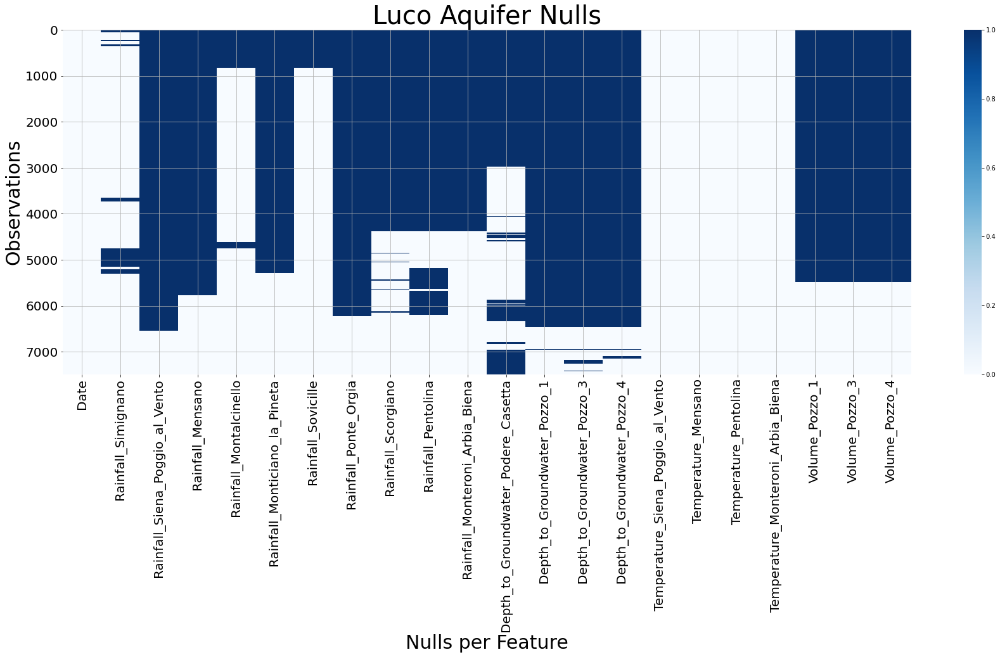

In [0]:
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rc
import numpy as np

AqLuc=df_AqLuc.toPandas()

plt.figure(figsize=(30,10))
sns.heatmap(AqLuc.isnull(),  cmap='Blues')
plt.xlabel('Nulls per Feature',{'size': 30})
plt.ylabel('Observations',{'size': 30})
plt.title('Luco Aquifer Nulls', {'size':40})
plt.yticks(np.arange(0, 7487, 1000), np.arange(0, 7487, 1000), fontsize=20)
plt.xticks(fontsize=20)# add loads of ticks
plt.grid()
#plt.tight_layout()

Out[11]: array([[<AxesSubplot:title={'center':'Rainfall_Simignano'}>,
        <AxesSubplot:title={'center':'Rainfall_Siena_Poggio_al_Vento'}>,
        <AxesSubplot:title={'center':'Rainfall_Mensano'}>,
        <AxesSubplot:title={'center':'Rainfall_Montalcinello'}>,
        <AxesSubplot:title={'center':'Rainfall_Monticiano_la_Pineta'}>],
       [<AxesSubplot:title={'center':'Rainfall_Sovicille'}>,
        <AxesSubplot:title={'center':'Rainfall_Ponte_Orgia'}>,
        <AxesSubplot:title={'center':'Rainfall_Scorgiano'}>,
        <AxesSubplot:title={'center':'Rainfall_Pentolina'}>,
        <AxesSubplot:title={'center':'Rainfall_Monteroni_Arbia_Biena'}>],
       [<AxesSubplot:title={'center':'Depth_to_Groundwater_Podere_Casetta'}>,
        <AxesSubplot:title={'center':'Depth_to_Groundwater_Pozzo_1'}>,
        <AxesSubplot:title={'center':'Depth_to_Groundwater_Pozzo_3'}>,
        <AxesSubplot:title={'center':'Depth_to_Groundwater_Pozzo_4'}>,
        <AxesSubplot:title={'center':'Temperature

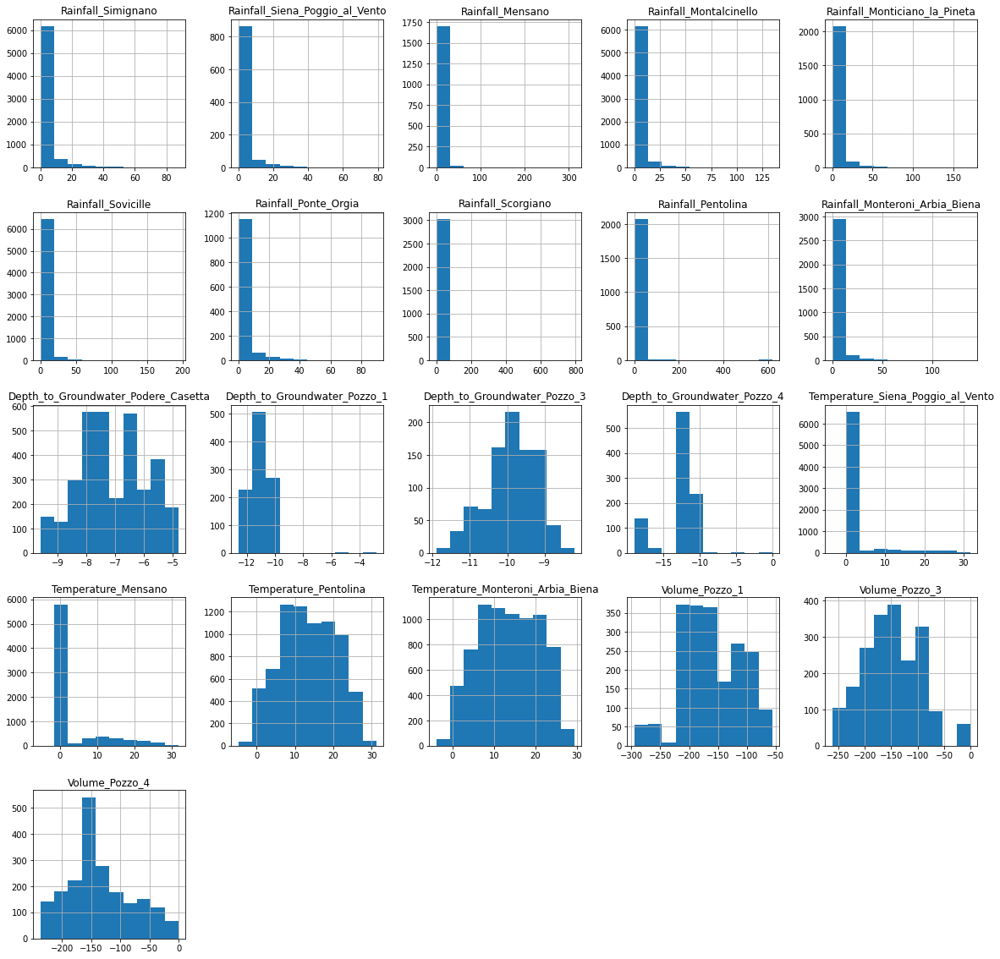

In [0]:
AqLuc.hist(figsize=(20,20))

In [0]:
import pandas as pd
def missing_data(df):
    is_null_data = df.isnull()
    total = is_null_data.sum()
    percent = ((total/is_null_data.count())*100)
    missing_data = pd.concat([total, percent], axis=1, keys=['Total Missing', 'Percent'])
    
    return missing_data.sort_values(by = 'Percent', ascending=False)

missing_data(AqLuc)

,Total Missing,Percent
Depth_to_Groundwater_Pozzo_3,6567,87.712034
Rainfall_Siena_Poggio_al_Vento,6536,87.297983
Depth_to_Groundwater_Pozzo_4,6518,87.057566
Depth_to_Groundwater_Pozzo_1,6475,86.483238
Rainfall_Ponte_Orgia,6227,83.170829
Rainfall_Mensano,5765,77.000134
Volume_Pozzo_4,5479,73.180179
Volume_Pozzo_3,5479,73.180179
Volume_Pozzo_1,5479,73.180179
Rainfall_Pentolina,5371,71.737679


After observing the nulls we saw that all the groundwater depth features had more than 50% of its missing values but something be done with the Podere Casetta. 

The above figure is a representation for all groundwater depth, and this visual shows that data quality of Pozzo 1, 3 and 4 is inadequate. Since 2015, data on Volumes Pozzo 3 and 4 has been recorded. In 2014, there is a gap in the "Rainfall in Simignano" series. In addition, the specified target variable – "Depth to Groundwater Podere Casetta" – has a number of gaps.  There appear to be major gaps in "Depth to Groundwater Podere Casetta," which has the least percent of missing data, the missing value can be interpolated.

In [0]:
def mask(df):
    mask = np.zeros_like(df.corr())
    triangle= np.triu_indices_from(mask)
    mask[triangle]=True
    return mask

Out[14]: (array([ 0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5, 10.5,
        11.5, 12.5, 13.5, 14.5, 15.5, 16.5, 17.5, 18.5, 19.5, 20.5]),
 [Text(0.5, 0, 'Rainfall_Simignano'),
  Text(1.5, 0, 'Rainfall_Siena_Poggio_al_Vento'),
  Text(2.5, 0, 'Rainfall_Mensano'),
  Text(3.5, 0, 'Rainfall_Montalcinello'),
  Text(4.5, 0, 'Rainfall_Monticiano_la_Pineta'),
  Text(5.5, 0, 'Rainfall_Sovicille'),
  Text(6.5, 0, 'Rainfall_Ponte_Orgia'),
  Text(7.5, 0, 'Rainfall_Scorgiano'),
  Text(8.5, 0, 'Rainfall_Pentolina'),
  Text(9.5, 0, 'Rainfall_Monteroni_Arbia_Biena'),
  Text(10.5, 0, 'Depth_to_Groundwater_Podere_Casetta'),
  Text(11.5, 0, 'Depth_to_Groundwater_Pozzo_1'),
  Text(12.5, 0, 'Depth_to_Groundwater_Pozzo_3'),
  Text(13.5, 0, 'Depth_to_Groundwater_Pozzo_4'),
  Text(14.5, 0, 'Temperature_Siena_Poggio_al_Vento'),
  Text(15.5, 0, 'Temperature_Mensano'),
  Text(16.5, 0, 'Temperature_Pentolina'),
  Text(17.5, 0, 'Temperature_Monteroni_Arbia_Biena'),
  Text(18.5, 0, 'Volume_Pozzo_1'),


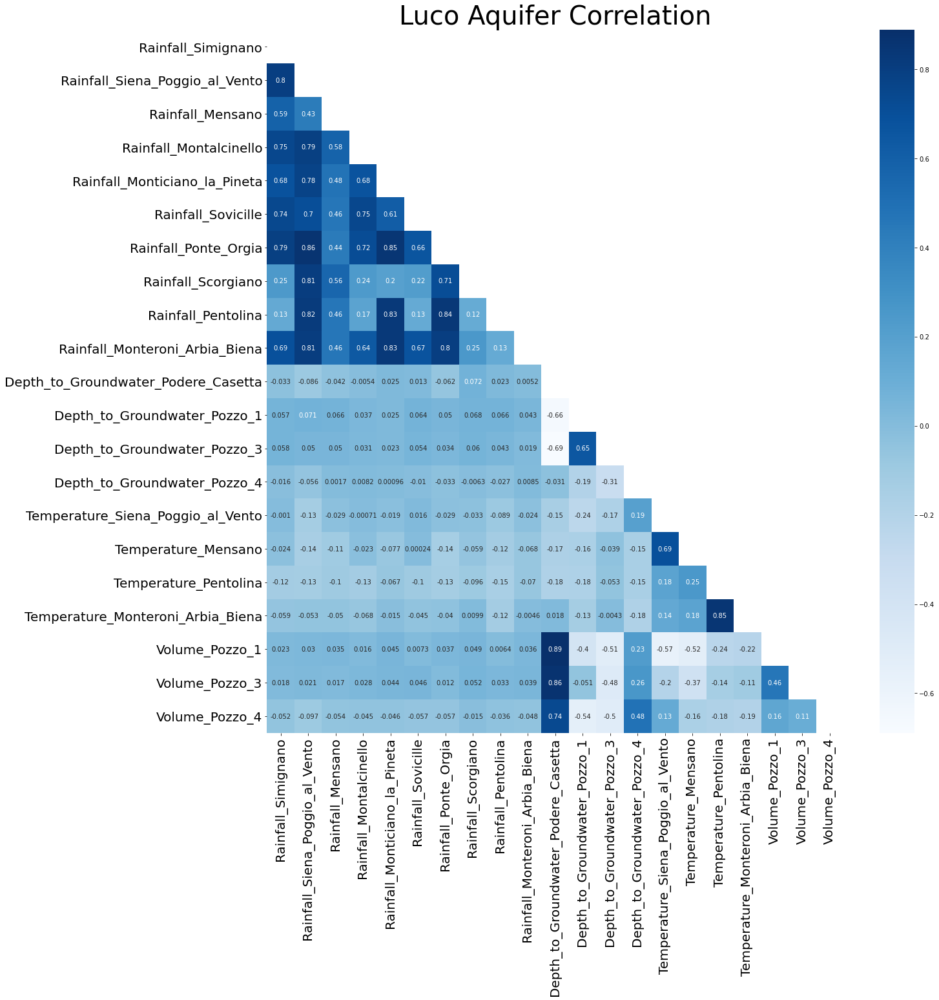

In [0]:
plt.figure(figsize=(20,20))
sns.heatmap(AqLuc.corr(),  cmap='Blues', mask = mask(AqLuc), annot=True, annot_kws= {'size':10})
plt.title('Luco Aquifer Correlation', {'size':40})
plt.yticks(fontsize=20)
plt.xticks(fontsize=20)# add loads of ticks

There are no alternative possibilities since there is too much data lacking in the other "Depth to Groundwater" variables that may be targeted instead, despite the fact that there is a relationship between the selected target variable . The choice of "Volume" variables is quite broad since "Depth to Groundwater Podere Casetta" is almost equally associated with "Volume" factors.

The correlation heatmap shows that most feature have a low correlation. The below table is focuses on the correlation of Podere Casetta groundwater depth

In [0]:
pd.DataFrame(AqLuc.corr()['Depth_to_Groundwater_Podere_Casetta'])

,Depth_to_Groundwater_Podere_Casetta
Rainfall_Simignano,-0.032674
Rainfall_Siena_Poggio_al_Vento,-0.086189
Rainfall_Mensano,-0.042063
Rainfall_Montalcinello,-0.005368
Rainfall_Monticiano_la_Pineta,0.025352
Rainfall_Sovicille,0.013379
Rainfall_Ponte_Orgia,-0.062499
Rainfall_Scorgiano,0.071768
Rainfall_Pentolina,0.022776
Rainfall_Monteroni_Arbia_Biena,0.005196


Out[16]: Text(0.5, 0, 'Date')

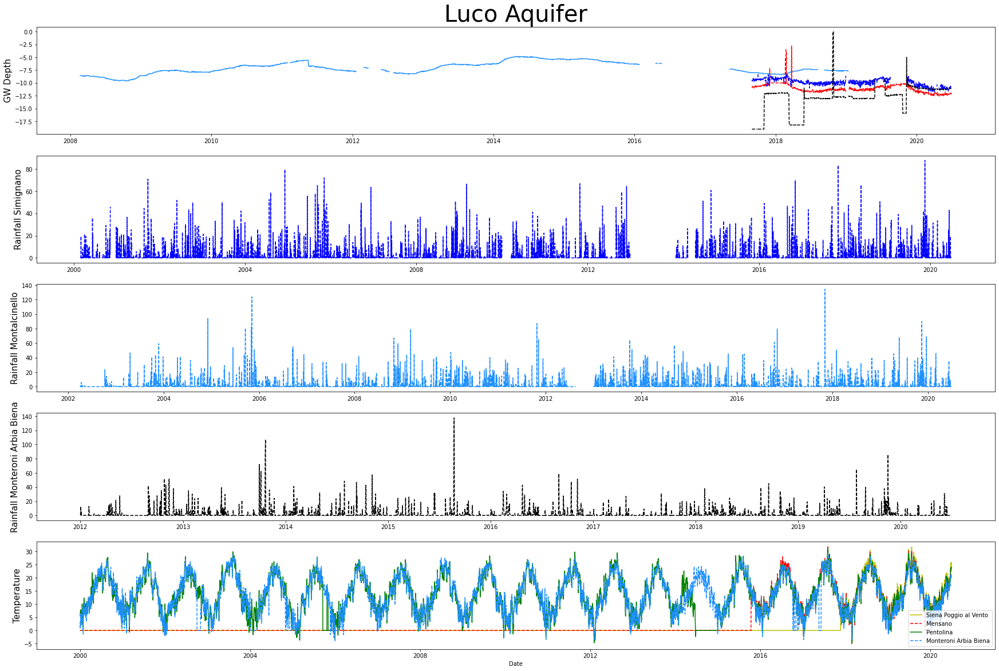

In [0]:
plt.figure(figsize=(30,20))

plt.subplot(511)
plt.title('Luco Aquifer', {'size':40})
plt.plot(AqLuc['Date'], AqLuc['Depth_to_Groundwater_Podere_Casetta'], '-', color = 'dodgerblue', label='Podere Casetta')
plt.plot(AqLuc['Date'], AqLuc['Depth_to_Groundwater_Pozzo_1'], 'r--',label='Pozzo 1')
plt.plot(AqLuc['Date'], AqLuc['Depth_to_Groundwater_Pozzo_3'], 'b--', label='Pozzo 3')
plt.plot(AqLuc['Date'], AqLuc['Depth_to_Groundwater_Pozzo_4'], 'k--', label='Pozzo 4')
plt.ylabel('GW Depth', {'size': 15})

plt.subplot(512)
plt.plot(AqLuc['Date'], AqLuc['Rainfall_Simignano'], 'b--')
plt.ylabel('Rainfall Simignano', {'size': 15})

plt.subplot(513)
plt.plot(AqLuc['Date'], AqLuc['Rainfall_Montalcinello'], '--', color = 'dodgerblue')
plt.ylabel('Rainfall Montalcinello', {'size': 15})

plt.subplot(514)
plt.plot(AqLuc['Date'], AqLuc['Rainfall_Monteroni_Arbia_Biena'],'k--')
plt.ylabel('Rainfall Monteroni Arbia Biena', {'size': 15})

plt.subplot(515)
plt.plot(AqLuc['Date'], AqLuc['Temperature_Siena_Poggio_al_Vento'],'y-')
plt.plot(AqLuc['Date'], AqLuc['Temperature_Mensano'],'r--')
plt.plot(AqLuc['Date'], AqLuc['Temperature_Pentolina'],'g-')
plt.plot(AqLuc['Date'], AqLuc['Temperature_Monteroni_Arbia_Biena'],'--', color = 'dodgerblue')
plt.legend(['Siena Poggio al Vento', 'Mensano', 'Pentolina', 'Monteroni Arbia Biena'])
plt.ylabel('Temperature', {'size': 15})
plt.xlabel('Date')

<a href=#cont> **Back to table of content**

---
---

### 6.2. Aquifer Petrignano EDA

---
---

In [0]:
df_AqPet.show()

+----------+---------------------+------------------------+------------------------+------------------------+----------------------+---------------------+------------------------------------+
|      Date|Rainfall_Bastia_Umbra|Depth_to_Groundwater_P24|Depth_to_Groundwater_P25|Temperature_Bastia_Umbra|Temperature_Petrignano|Volume_C10_Petrignano|Hydrometry_Fiume_Chiascio_Petrignano|
+----------+---------------------+------------------------+------------------------+------------------------+----------------------+---------------------+------------------------------------+
|14/03/2006|                 null|                  -22.48|                  -22.18|                    null|                  null|                 null|                                null|
|15/03/2006|                 null|                  -22.38|                  -22.14|                    null|                  null|                 null|                                null|
|16/03/2006|                 null|      

In [0]:
df_AqPet= df_AqPet.withColumn('Date',to_date("Date","dd/MM/yyyy"))
df_AqPet.printSchema()

root
 |-- Date: date (nullable = true)
 |-- Rainfall_Bastia_Umbra: float (nullable = true)
 |-- Depth_to_Groundwater_P24: float (nullable = true)
 |-- Depth_to_Groundwater_P25: float (nullable = true)
 |-- Temperature_Bastia_Umbra: float (nullable = true)
 |-- Temperature_Petrignano: float (nullable = true)
 |-- Volume_C10_Petrignano: float (nullable = true)
 |-- Hydrometry_Fiume_Chiascio_Petrignano: float (nullable = true)



In [0]:
df_AqPet.select(df_AqPet.columns).describe().show()

+-------+---------------------+------------------------+------------------------+------------------------+----------------------+---------------------+------------------------------------+
|summary|Rainfall_Bastia_Umbra|Depth_to_Groundwater_P24|Depth_to_Groundwater_P25|Temperature_Bastia_Umbra|Temperature_Petrignano|Volume_C10_Petrignano|Hydrometry_Fiume_Chiascio_Petrignano|
+-------+---------------------+------------------------+------------------------+------------------------+----------------------+---------------------+------------------------------------+
|  count|                 4199|                    5168|                    5184|                    4199|                  4199|                 5025|                                4199|
|   mean|   1.5566325338114213|      -26.26372290727893|     -25.692926313038225|       15.03029293077216|         13.7390807428|   -29043.29671855566|                  2.3725172641249492|
| stddev|    5.217922564186059|       3.319858392888862

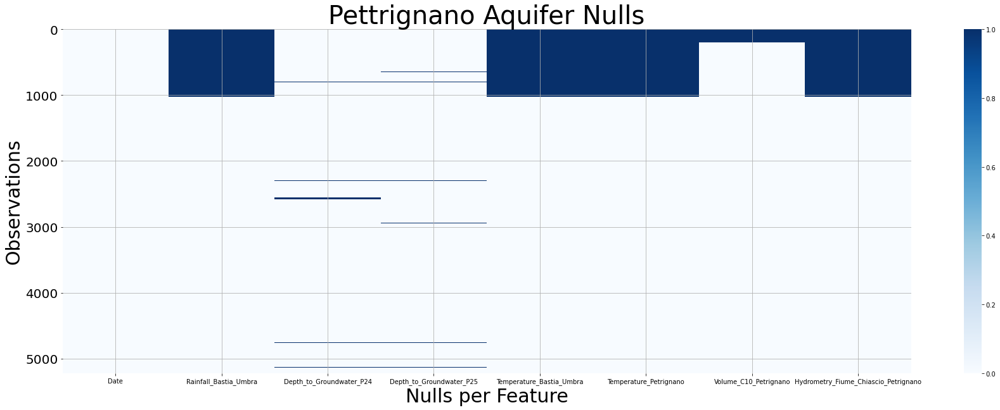

In [0]:
AqPet=df_AqPet.toPandas()

plt.figure(figsize=(30,10))
sns.heatmap(AqPet.isnull(), cmap='Blues')
plt.xlabel('Nulls per Feature',{'size': 30})
plt.ylabel('Observations',{'size': 30})
plt.title('Pettrignano Aquifer Nulls', {'size':40})
plt.yticks(np.arange(0, 5487, 1000), np.arange(0, 5487, 1000), fontsize=20)
plt.xticks(fontsize=10)# add loads of ticks
plt.grid()
#plt.tight_layout()

In [0]:
missing_data(AqPet)

,Total Missing,Percent
Rainfall_Bastia_Umbra,1024,19.605591
Temperature_Bastia_Umbra,1024,19.605591
Temperature_Petrignano,1024,19.605591
Hydrometry_Fiume_Chiascio_Petrignano,1024,19.605591
Volume_C10_Petrignano,198,3.790925
Depth_to_Groundwater_P24,55,1.053035
Depth_to_Groundwater_P25,39,0.746697
Date,0,0.000000


Out[22]: (array([0.5, 1.5, 2.5, 3.5, 4.5, 5.5, 6.5]),
 [Text(0.5, 0, 'Rainfall_Bastia_Umbra'),
  Text(1.5, 0, 'Depth_to_Groundwater_P24'),
  Text(2.5, 0, 'Depth_to_Groundwater_P25'),
  Text(3.5, 0, 'Temperature_Bastia_Umbra'),
  Text(4.5, 0, 'Temperature_Petrignano'),
  Text(5.5, 0, 'Volume_C10_Petrignano'),
  Text(6.5, 0, 'Hydrometry_Fiume_Chiascio_Petrignano')])

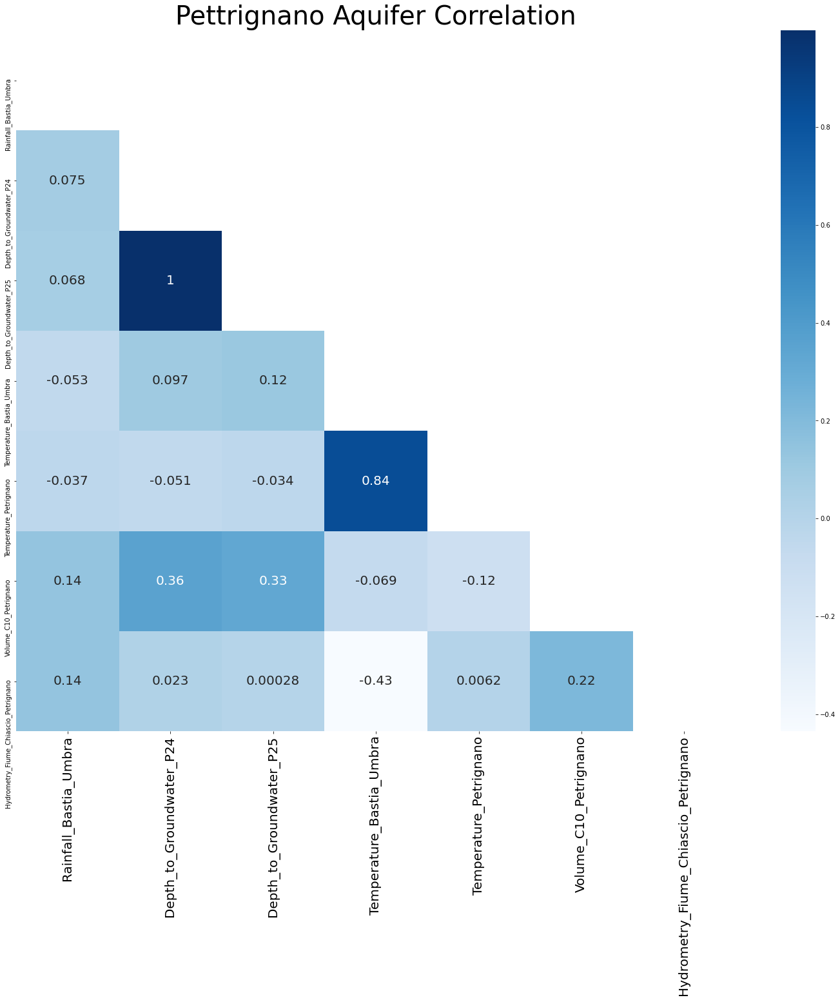

In [0]:
plt.figure(figsize=(25,20))
sns.heatmap(AqPet.corr(), cmap='Blues', mask = mask(AqPet), annot=True, annot_kws= {'size':20})
plt.title('Pettrignano Aquifer Correlation', {'size':40})
plt.yticks(fontsize=10)
plt.xticks(fontsize=20)# add loads of ticks

In [0]:
pd.DataFrame(AqPet.corr())[['Depth_to_Groundwater_P24','Depth_to_Groundwater_P25']]

,Depth_to_Groundwater_P24,Depth_to_Groundwater_P25
Rainfall_Bastia_Umbra,0.075098,0.067708
Depth_to_Groundwater_P24,1.000000,0.997506
Depth_to_Groundwater_P25,0.997506,1.000000
Temperature_Bastia_Umbra,0.097207,0.117417
Temperature_Petrignano,-0.051347,-0.034472
Volume_C10_Petrignano,0.357537,0.325056
Hydrometry_Fiume_Chiascio_Petrignano,0.022641,0.000276


Out[24]: Text(0, 0.5, 'Hydrometry')

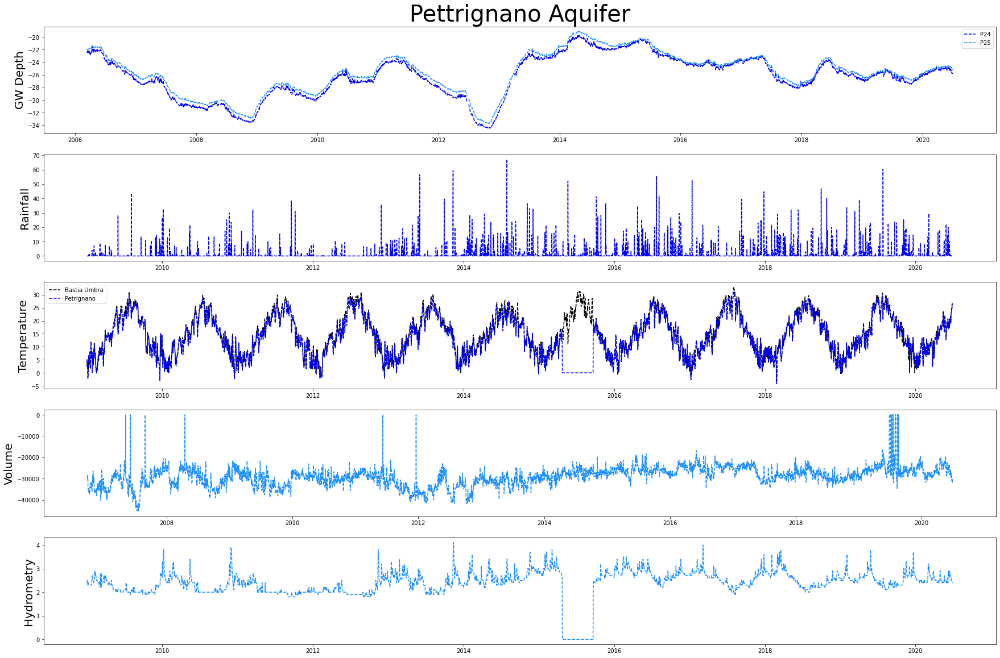

In [0]:
plt.figure(figsize=(30,20))

plt.subplot(511)
plt.title('Pettrignano Aquifer', {'size':40})
plt.plot(AqPet['Date'], AqPet['Depth_to_Groundwater_P24'], 'b--', label='P24' )
plt.plot(AqPet['Date'], AqPet['Depth_to_Groundwater_P25'], '--', color = 'dodgerblue', label='P25' )
plt.ylabel('GW Depth', {'size': 20})
plt.legend()

plt.subplot(512)
plt.plot(AqPet['Date'], AqPet['Rainfall_Bastia_Umbra'], 'b--')
plt.ylabel('Rainfall', {'size': 20})

plt.subplot(513)
plt.plot(AqPet['Date'], AqPet['Temperature_Bastia_Umbra'], 'k--', label='Bastia Umbra')
plt.plot(AqPet['Date'], AqPet['Temperature_Petrignano'], 'b--', label='Petrignano')
plt.ylabel('Temperature', {'size': 20})
plt.legend()

plt.subplot(514)
plt.plot(AqPet['Date'], AqPet['Volume_C10_Petrignano'],'--', color='dodgerblue')
plt.ylabel('Volume', {'size': 20})

plt.subplot(515)
plt.plot(AqPet['Date'], AqPet['Hydrometry_Fiume_Chiascio_Petrignano'],'--', color='dodgerblue')
plt.ylabel('Hydrometry', {'size': 20})

<a href=#cont> **Back to table of content**

<a id="seven"></a>
## 7. Feature Enginneering

---
---

### 7.1 Aquifer Luco Feature Engineering

---
---

**Adding new features**

In [0]:
from pyspark.sql import functions as f
df_AqLuc=(df_AqLuc
.withColumn('year',f.year('date'))
.withColumn('quarter_of_year', f.quarter('date'))
.withColumn('month', f.month('date'))
.withColumn('week_of_year', f.weekofyear('date'))
.withColumn('day_of_week',f.dayofweek('date')))

In [0]:
df_AqLuc.columns

Out[26]: ['Date',
 'Rainfall_Simignano',
 'Rainfall_Siena_Poggio_al_Vento',
 'Rainfall_Mensano',
 'Rainfall_Montalcinello',
 'Rainfall_Monticiano_la_Pineta',
 'Rainfall_Sovicille',
 'Rainfall_Ponte_Orgia',
 'Rainfall_Scorgiano',
 'Rainfall_Pentolina',
 'Rainfall_Monteroni_Arbia_Biena',
 'Depth_to_Groundwater_Podere_Casetta',
 'Depth_to_Groundwater_Pozzo_1',
 'Depth_to_Groundwater_Pozzo_3',
 'Depth_to_Groundwater_Pozzo_4',
 'Temperature_Siena_Poggio_al_Vento',
 'Temperature_Mensano',
 'Temperature_Pentolina',
 'Temperature_Monteroni_Arbia_Biena',
 'Volume_Pozzo_1',
 'Volume_Pozzo_3',
 'Volume_Pozzo_4',
 'year',
 'quarter_of_year',
 'month',
 'week_of_year',
 'day_of_week']

**Below is the rearrangement of features**

In [0]:
df_AqLuc= df_AqLuc.select('Date',
 'year',
 'quarter_of_year',
 'month',
 'week_of_year',
 'day_of_week',
 'Rainfall_Simignano',
 'Rainfall_Siena_Poggio_al_Vento',
 'Rainfall_Mensano',
 'Rainfall_Montalcinello',
 'Rainfall_Monticiano_la_Pineta',
 'Rainfall_Sovicille',
 'Rainfall_Ponte_Orgia',
 'Rainfall_Scorgiano',
 'Rainfall_Pentolina',
 'Rainfall_Monteroni_Arbia_Biena',
 'Temperature_Siena_Poggio_al_Vento',
 'Temperature_Mensano',
 'Temperature_Pentolina',
 'Temperature_Monteroni_Arbia_Biena',
 'Volume_Pozzo_1',
 'Volume_Pozzo_3',
 'Volume_Pozzo_4',
 'Depth_to_Groundwater_Podere_Casetta',
 'Depth_to_Groundwater_Pozzo_1',
 'Depth_to_Groundwater_Pozzo_3',
 'Depth_to_Groundwater_Pozzo_4')

In [0]:
df_AqLuc.display()

Date,year,quarter_of_year,month,week_of_year,day_of_week,Rainfall_Simignano,Rainfall_Siena_Poggio_al_Vento,Rainfall_Mensano,Rainfall_Montalcinello,Rainfall_Monticiano_la_Pineta,Rainfall_Sovicille,Rainfall_Ponte_Orgia,Rainfall_Scorgiano,Rainfall_Pentolina,Rainfall_Monteroni_Arbia_Biena,Temperature_Siena_Poggio_al_Vento,Temperature_Mensano,Temperature_Pentolina,Temperature_Monteroni_Arbia_Biena,Volume_Pozzo_1,Volume_Pozzo_3,Volume_Pozzo_4,Depth_to_Groundwater_Podere_Casetta,Depth_to_Groundwater_Pozzo_1,Depth_to_Groundwater_Pozzo_3,Depth_to_Groundwater_Pozzo_4
2000-01-01,2000,1,1,52,7,null,null,null,null,null,null,null,null,null,null,0.0,0.0,5.5,0.8,null,null,null,null,null,null,null
2000-01-02,2000,1,1,52,1,null,null,null,null,null,null,null,null,null,null,0.0,0.0,6.2,3.25,null,null,null,null,null,null,null
2000-01-03,2000,1,1,1,2,null,null,null,null,null,null,null,null,null,null,0.0,0.0,7.25,0.95,null,null,null,null,null,null,null
2000-01-04,2000,1,1,1,3,null,null,null,null,null,null,null,null,null,null,0.0,0.0,7.0,4.2,null,null,null,null,null,null,null
2000-01-05,2000,1,1,1,4,null,null,null,null,null,null,null,null,null,null,0.0,0.0,7.9,6.55,null,null,null,null,null,null,null
2000-01-06,2000,1,1,1,5,null,null,null,null,null,null,null,null,null,null,0.0,0.0,6.5,3.95,null,null,null,null,null,null,null
2000-01-07,2000,1,1,1,6,null,null,null,null,null,null,null,null,null,null,0.0,0.0,7.45,6.45,null,null,null,null,null,null,null
2000-01-08,2000,1,1,1,7,null,null,null,null,null,null,null,null,null,null,0.0,0.0,5.6,5.3,null,null,null,null,null,null,null
2000-01-09,2000,1,1,1,1,null,null,null,null,null,null,null,null,null,null,0.0,0.0,6.1,6.45,null,null,null,null,null,null,null
2000-01-10,2000,1,1,2,2,null,null,null,null,null,null,null,null,null,null,0.0,0.0,6.7,5.45,null,null,null,null,null,null,null


**Dropping rows that are null for the target variable at the beginning**

In [0]:
df_AqLuc=df_AqLuc[df_AqLuc['Date']>'2008-02-20']
df_AqLuc=df_AqLuc[df_AqLuc['Date']<'2019-01-13']

In [0]:
AqLuc=df_AqLuc.toPandas()

In [0]:
interpolate = AqLuc['Depth_to_Groundwater_Podere_Casetta'].interpolate()

Out[32]: Text(0.5, 1.0, 'Luco Aquifer')

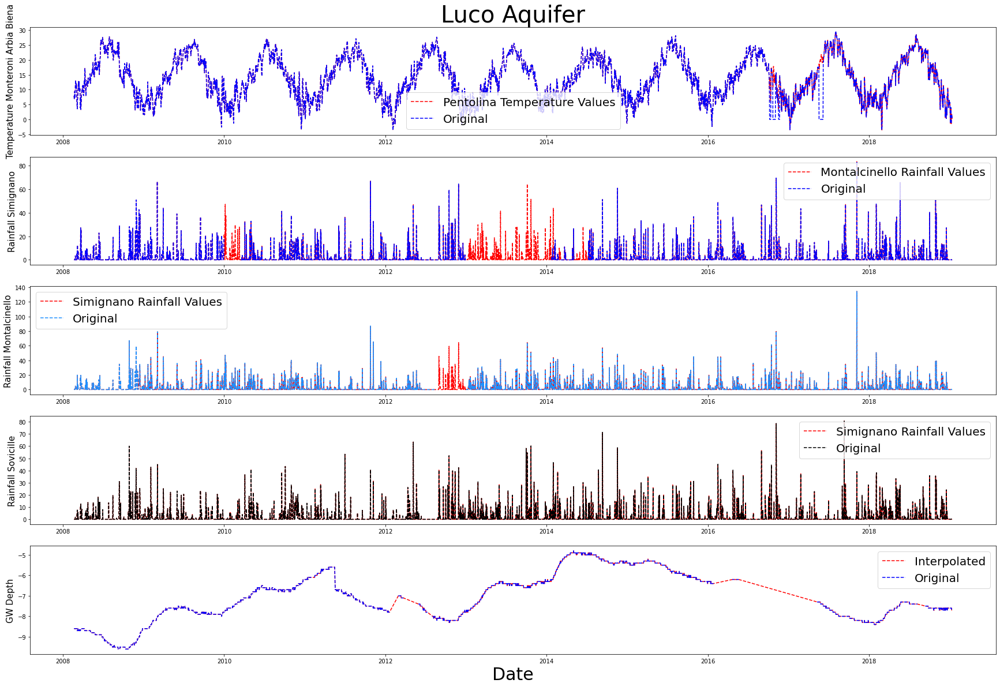

In [0]:
import numpy as np

plt.figure(figsize=(30,20))

plt.subplot(515)
plt.xlabel('Date', {'size': 30})
#plt.title('Luco Aquifer', {'size':40})
plt.plot(AqLuc['Date'],AqLuc['Depth_to_Groundwater_Podere_Casetta'].fillna(interpolate), 'r--', label='Interpolated')
plt.plot(AqLuc['Date'],AqLuc['Depth_to_Groundwater_Podere_Casetta'], 'b--', label='Original')
plt.ylabel('GW Depth', {'size': 15})
plt.legend(loc='best', prop={'size':20})

plt.subplot(512)

plt.plot(AqLuc['Date'], AqLuc['Rainfall_Simignano'].fillna(AqLuc['Rainfall_Montalcinello']), 'r--',label='Montalcinello Rainfall Values')
plt.plot(AqLuc['Date'], AqLuc['Rainfall_Simignano'], 'b--', label='Original')
plt.ylabel('Rainfall Simignano', {'size': 15})
plt.legend(loc='best', prop={'size':20})

plt.subplot(513)
plt.plot(AqLuc['Date'], AqLuc['Rainfall_Montalcinello'].fillna(AqLuc['Rainfall_Simignano']), 'r--', label='Simignano Rainfall Values')
plt.plot(AqLuc['Date'], AqLuc['Rainfall_Montalcinello'], '--', color = 'dodgerblue', label='Original')
plt.ylabel('Rainfall Montalcinello', {'size': 15})
plt.legend(loc='best', prop={'size':20})

plt.subplot(514)
plt.plot(AqLuc['Date'], AqLuc['Rainfall_Sovicille'].fillna(AqLuc['Rainfall_Simignano']),'r--', label='Simignano Rainfall Values')
plt.plot(AqLuc['Date'], AqLuc['Rainfall_Sovicille'],'k--', label='Original')
plt.ylabel('Rainfall Sovicille', {'size': 15})
plt.legend(loc='best', prop={'size':20})

plt.subplot(511)
plt.plot(AqLuc['Date'], AqLuc['Temperature_Monteroni_Arbia_Biena'].replace(0, np.nan).fillna( AqLuc['Temperature_Pentolina']),'r--', label='Pentolina Temperature Values')
plt.plot(AqLuc['Date'], AqLuc['Temperature_Monteroni_Arbia_Biena'],'b--', label='Original')
plt.legend(loc='best', prop={'size':20})
plt.ylabel('Temperature Monteroni Arbia Biena', {'size': 15})
plt.title('Luco Aquifer', {'size':40})
#plt.xlabel('Date', {'size': 30})
#set_xlim([date(2017,9,30),date(2020,6,30)])

In [0]:
AqLuc['Temperature_Monteroni_Arbia_Biena']= AqLuc['Temperature_Monteroni_Arbia_Biena'].replace(0, np.nan)
AqLuc['Temperature_Monteroni_Arbia_Biena']=AqLuc['Temperature_Monteroni_Arbia_Biena'].fillna( AqLuc['Temperature_Pentolina'])

In [0]:
AqLuc['Depth_to_Groundwater_Podere_Casetta']=AqLuc['Depth_to_Groundwater_Podere_Casetta'].fillna(interpolate)
AqLuc['Rainfall_Montalcinello']=AqLuc['Rainfall_Montalcinello'].fillna(AqLuc['Rainfall_Simignano'])
AqLuc['Rainfall_Simignano']=AqLuc['Rainfall_Simignano'].fillna(AqLuc['Rainfall_Montalcinello'])
AqLuc['Rainfall_Sovicille']=AqLuc['Rainfall_Sovicille'].fillna(AqLuc['Rainfall_Simignano'])

In [0]:
df_AqLuc=spark.createDataFrame(AqLuc)

**Dropping useless features**

In [0]:
df_AqLuc=(df_AqLuc
.drop('Rainfall_Siena_Poggio_al_Vento')
.drop('Rainfall_Mensano')
.drop('Rainfall_Monticiano_la_Pineta')
.drop('Rainfall_Ponte_Orgia')
.drop('Rainfall_Scorgiano')
.drop('Rainfall_Pentolina')
.drop('Rainfall_Monteroni_Arbia_Biena')
.drop('Depth_to_Groundwater_Pozzo_1')
.drop('Depth_to_Groundwater_Pozzo_3')
.drop('Depth_to_Groundwater_Pozzo_4')
.drop('Volume_Pozzo_1')
.drop('Volume_Pozzo_3')
.drop('Volume_Pozzo_4')
.drop('Temperature_Siena_Poggio_al_Vento')
.drop('Temperature_Mensano')
.drop('Temperature_Pentolina'))

In [0]:
df_AqLuc.show()

+----------+----+---------------+-----+------------+-----------+------------------+----------------------+------------------+---------------------------------+-----------------------------------+
|      Date|year|quarter_of_year|month|week_of_year|day_of_week|Rainfall_Simignano|Rainfall_Montalcinello|Rainfall_Sovicille|Temperature_Monteroni_Arbia_Biena|Depth_to_Groundwater_Podere_Casetta|
+----------+----+---------------+-----+------------+-----------+------------------+----------------------+------------------+---------------------------------+-----------------------------------+
|2008-02-21|2008|              1|    2|           8|          5|               0.0|                   0.0|               0.0|                              7.9|                               -8.6|
|2008-02-22|2008|              1|    2|           8|          6|               0.0|                   0.2|               0.0|                              7.0|                               -8.6|
|2008-02-23|2008|   

<a href=#cont> **Back to table of content**

---
---

### 7.2. Aquifer Petrignano Feature Engineering

---
---

In [0]:
df_AqPet=(df_AqPet
.withColumn('year',f.year('date'))
.withColumn('quarter_of_year', f.quarter('date'))
.withColumn('month', f.month('date'))
.withColumn('week_of_year', f.weekofyear('date'))
.withColumn('day_of_week',f.dayofweek('date')))

In [0]:
df_AqPet= df_AqPet.select('Date',
 'year',
 'quarter_of_year',
 'month',
 'week_of_year',
 'day_of_week',
 'Rainfall_Bastia_Umbra',
 'Temperature_Bastia_Umbra',
 'Temperature_Petrignano',
 'Volume_C10_Petrignano',
 'Hydrometry_Fiume_Chiascio_Petrignano',
 'Depth_to_Groundwater_P24',
 'Depth_to_Groundwater_P25')

In [0]:
df_AqPet.display()

Date,year,quarter_of_year,month,week_of_year,day_of_week,Rainfall_Bastia_Umbra,Temperature_Bastia_Umbra,Temperature_Petrignano,Volume_C10_Petrignano,Hydrometry_Fiume_Chiascio_Petrignano,Depth_to_Groundwater_P24,Depth_to_Groundwater_P25
2006-03-14,2006,1,3,11,3,null,null,null,null,null,-22.48,-22.18
2006-03-15,2006,1,3,11,4,null,null,null,null,null,-22.38,-22.14
2006-03-16,2006,1,3,11,5,null,null,null,null,null,-22.25,-22.04
2006-03-17,2006,1,3,11,6,null,null,null,null,null,-22.38,-22.04
2006-03-18,2006,1,3,11,7,null,null,null,null,null,-22.6,-22.04
2006-03-19,2006,1,3,11,1,null,null,null,null,null,-22.35,-21.95
2006-03-20,2006,1,3,12,2,null,null,null,null,null,-22.5,-21.99
2006-03-21,2006,1,3,12,3,null,null,null,null,null,-22.31,-21.89
2006-03-22,2006,1,3,12,4,null,null,null,null,null,-22.31,-21.82
2006-03-23,2006,1,3,12,5,null,null,null,null,null,-22.4,-21.89


In [0]:
AqPet=df_AqPet.toPandas()

Out[42]: <matplotlib.legend.Legend at 0x7f83e9fafe50>

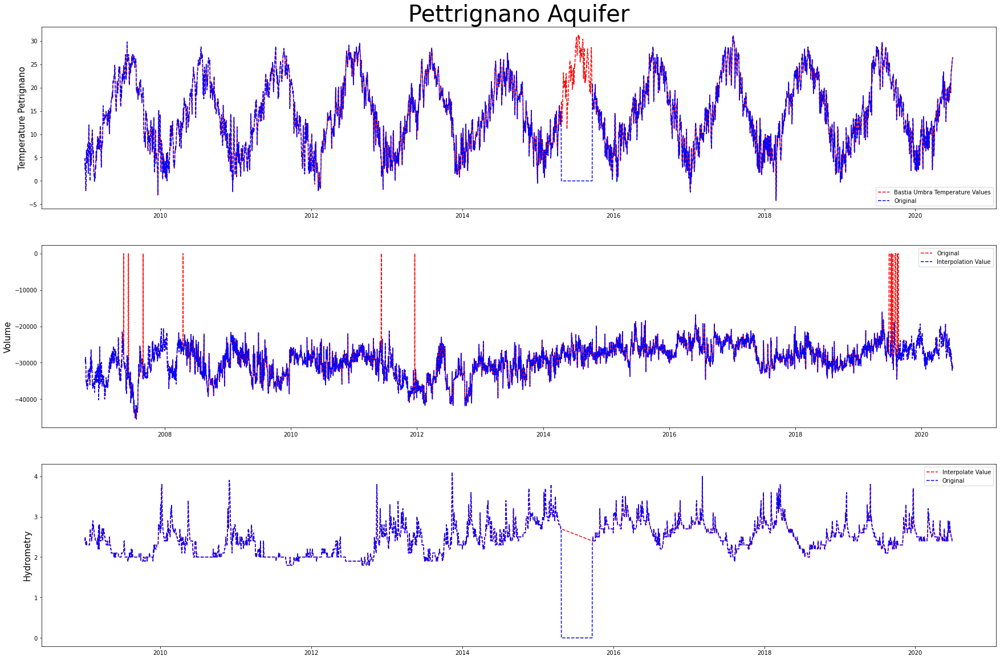

In [0]:
plt.figure(figsize=(30,20))

plt.subplot(311)
plt.title('Pettrignano Aquifer', {'size':40})
plt.plot(AqPet['Date'], AqPet['Temperature_Petrignano'].replace(0, np.nan).fillna(AqPet['Temperature_Bastia_Umbra']), 'r--', label='Bastia Umbra Temperature Values')
plt.plot(AqPet['Date'], AqPet['Temperature_Petrignano'], 'b--', label='Original')
plt.ylabel('Temperature Petrignano', {'size': 15})
plt.legend()

plt.subplot(312)
plt.plot(AqPet['Date'], AqPet['Volume_C10_Petrignano'],'r--', label='Original' )
plt.plot(AqPet['Date'], AqPet['Volume_C10_Petrignano'].replace(0, np.nan).interpolate(),'b--', label='Interpolation Value')
plt.ylabel('Volume', {'size': 15})
plt.legend()

plt.subplot(313)
plt.plot(AqPet['Date'], AqPet['Hydrometry_Fiume_Chiascio_Petrignano'].replace(0, np.nan).interpolate(),'r--', label='Interpolate Value')
plt.plot(AqPet['Date'], AqPet['Hydrometry_Fiume_Chiascio_Petrignano'],'b--', label='Original')
plt.ylabel('Hydrometry', {'size': 15})
plt.legend()

In [0]:
AqPet['Depth_to_Groundwater_P24']=AqPet['Depth_to_Groundwater_P24'].fillna(AqPet['Depth_to_Groundwater_P25']).interpolate()
AqPet['Depth_to_Groundwater_P25']=AqPet['Depth_to_Groundwater_P25'].fillna(AqPet['Depth_to_Groundwater_P24']).interpolate()

In [0]:
AqPet['Hydrometry_Fiume_Chiascio_Petrignano']=AqPet['Hydrometry_Fiume_Chiascio_Petrignano'].replace(0, np.nan).interpolate()
AqPet['Volume_C10_Petrignano']=AqPet['Volume_C10_Petrignano'].replace(0, np.nan).interpolate()

In [0]:
interpolate2 = AqPet['Depth_to_Groundwater_P24'].interpolate()
interpolate3 = AqPet['Depth_to_Groundwater_P25'].interpolate()
interpolate4 = AqPet['Volume_C10_Petrignano'].interpolate()
interpolate5 = AqPet['Hydrometry_Fiume_Chiascio_Petrignano'].interpolate()

In [0]:
AqPet['Depth_to_Groundwater_P24']=AqPet['Depth_to_Groundwater_P24'].fillna(interpolate2)
AqPet['Depth_to_Groundwater_P25']=AqPet['Depth_to_Groundwater_P25'].fillna(interpolate3)
AqPet['Volume_C10_Petrignano']=AqPet['Volume_C10_Petrignano'].fillna(interpolate4)
AqPet['Hydrometry_Fiume_Chiascio_Petrignano']=AqPet['Hydrometry_Fiume_Chiascio_Petrignano'].fillna(interpolate5)

In [0]:
AqPet['Rainfall_Bastia_Umbra']= AqPet['Rainfall_Bastia_Umbra'].interpolate(limit_direction='backward', limit_area= 'outside')
AqPet['Temperature_Bastia_Umbra']=AqPet['Temperature_Bastia_Umbra'].interpolate(limit_direction='backward', limit_area= 'outside')
AqPet['Temperature_Petrignano']=AqPet['Temperature_Petrignano'].interpolate(limit_direction='backward', limit_area= 'outside')
AqPet['Hydrometry_Fiume_Chiascio_Petrignano']=AqPet['Hydrometry_Fiume_Chiascio_Petrignano'].interpolate(limit_direction='backward', limit_area= 'outside')
AqPet['Volume_C10_Petrignano']=AqPet['Volume_C10_Petrignano'].interpolate(limit_direction='backward', limit_area= 'outside')

In [0]:
df_AqPet=spark.createDataFrame(AqPet)

<a href=#cont> **Back to table of content**

<a id="eight"></a>
## 8. Exploritary Data Analysis 2

---
---

### 8.1. Aquifer Luco EDA2

---
---

In [0]:
df_AqLuc.show()

+----------+----+---------------+-----+------------+-----------+------------------+----------------------+------------------+---------------------------------+-----------------------------------+
|      Date|year|quarter_of_year|month|week_of_year|day_of_week|Rainfall_Simignano|Rainfall_Montalcinello|Rainfall_Sovicille|Temperature_Monteroni_Arbia_Biena|Depth_to_Groundwater_Podere_Casetta|
+----------+----+---------------+-----+------------+-----------+------------------+----------------------+------------------+---------------------------------+-----------------------------------+
|2008-02-21|2008|              1|    2|           8|          5|               0.0|                   0.0|               0.0|                              7.9|                               -8.6|
|2008-02-22|2008|              1|    2|           8|          6|               0.0|                   0.2|               0.0|                              7.0|                               -8.6|
|2008-02-23|2008|   

In [0]:
df_AqLuc.select(df_AqLuc.columns).describe().show()

+-------+------------------+------------------+------------------+------------------+------------------+------------------+----------------------+------------------+---------------------------------+-----------------------------------+
|summary|              year|   quarter_of_year|             month|      week_of_year|       day_of_week|Rainfall_Simignano|Rainfall_Montalcinello|Rainfall_Sovicille|Temperature_Monteroni_Arbia_Biena|Depth_to_Groundwater_Podere_Casetta|
+-------+------------------+------------------+------------------+------------------+------------------+------------------+----------------------+------------------+---------------------------------+-----------------------------------+
|  count|              3979|              3979|              3979|              3979|              3979|              3979|                  3979|              3979|                             3979|                               3979|
|   mean|2013.0814274943452|2.5232470469967327| 6.571751

In [0]:
df_AqLuc.toPandas().info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3979 entries, 0 to 3978
Data columns (total 11 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   Date                                 3979 non-null   object 
 1   year                                 3979 non-null   int32  
 2   quarter_of_year                      3979 non-null   int32  
 3   month                                3979 non-null   int32  
 4   week_of_year                         3979 non-null   int32  
 5   day_of_week                          3979 non-null   int32  
 6   Rainfall_Simignano                   3979 non-null   float32
 7   Rainfall_Montalcinello               3979 non-null   float32
 8   Rainfall_Sovicille                   3979 non-null   float32
 9   Temperature_Monteroni_Arbia_Biena    3979 non-null   float32
 10  Depth_to_Groundwater_Podere_Casetta  3979 non-null   float32
dtypes: float32(5), int32(5), objec

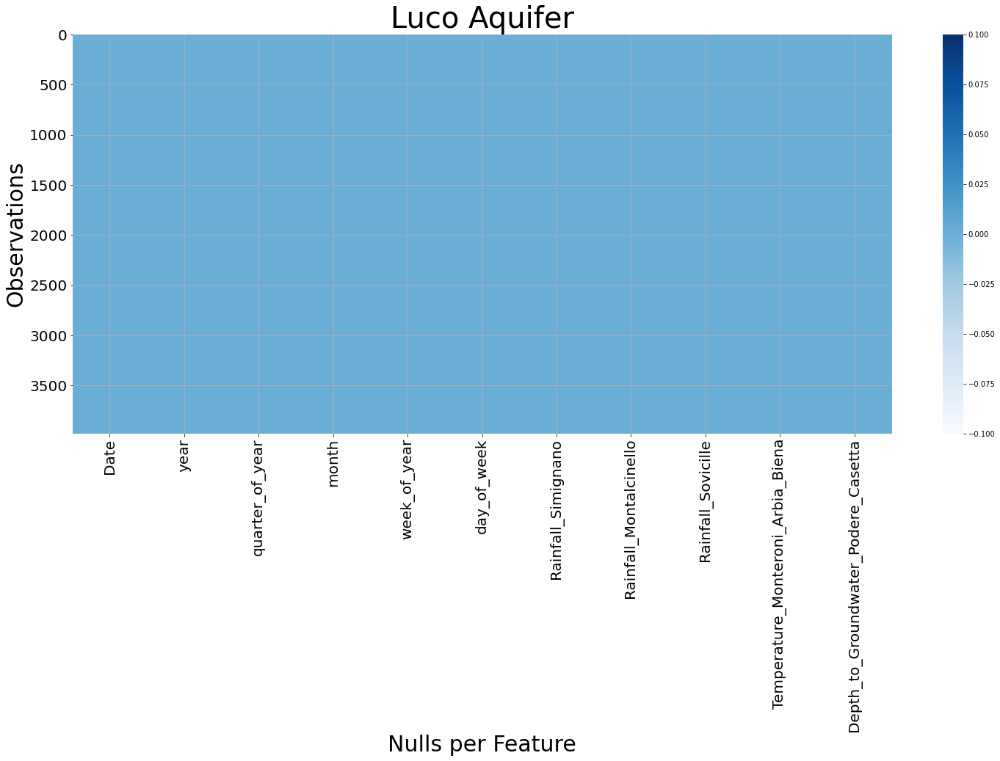

In [0]:
plt.figure(figsize=(25,10))
sns.heatmap(df_AqLuc.toPandas().isnull(), cmap= 'Blues')
plt.title('Luco Aquifer', {'size':40})
plt.xlabel('Nulls per Feature',{'size': 30})
plt.ylabel('Observations',{'size': 30})
plt.yticks(np.arange(0, 4000, 500), np.arange(0, 4000, 500), fontsize=20)
plt.xticks(fontsize=20)# add loads of ticks
plt.grid()

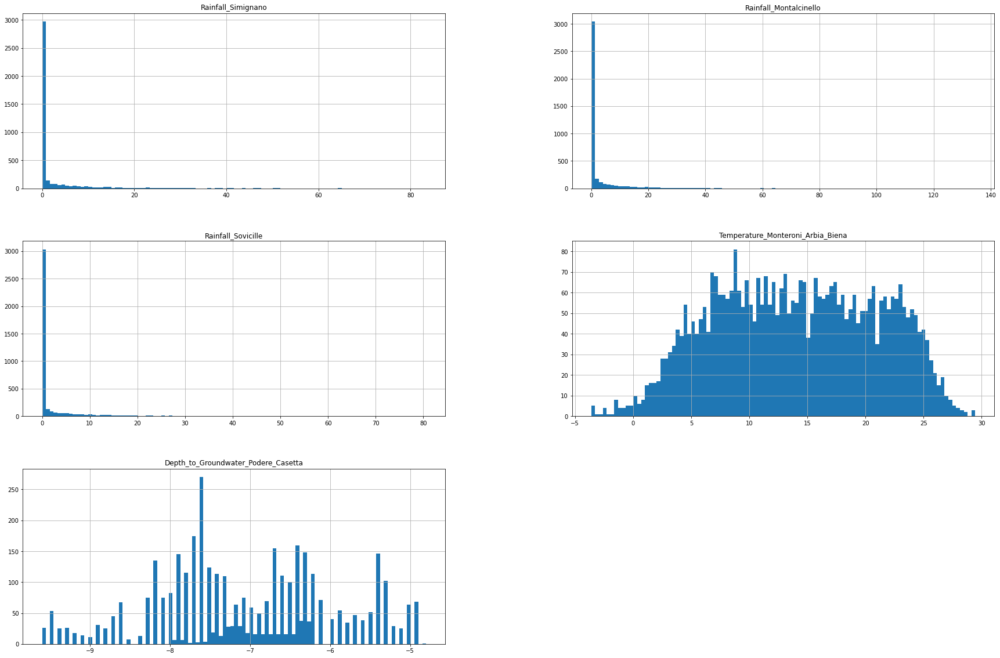

In [0]:
df_AqLuc.toPandas()[[ 'Rainfall_Simignano',
 'Rainfall_Montalcinello',
 'Rainfall_Sovicille',
 'Temperature_Monteroni_Arbia_Biena',
 'Depth_to_Groundwater_Podere_Casetta']].hist(figsize=(30,20), bins=100);

Out[54]: (array([0.5, 1.5, 2.5, 3.5, 4.5, 5.5, 6.5, 7.5, 8.5, 9.5]),
 [Text(0.5, 0, 'year'),
  Text(1.5, 0, 'quarter_of_year'),
  Text(2.5, 0, 'month'),
  Text(3.5, 0, 'week_of_year'),
  Text(4.5, 0, 'day_of_week'),
  Text(5.5, 0, 'Rainfall_Simignano'),
  Text(6.5, 0, 'Rainfall_Montalcinello'),
  Text(7.5, 0, 'Rainfall_Sovicille'),
  Text(8.5, 0, 'Temperature_Monteroni_Arbia_Biena'),
  Text(9.5, 0, 'Depth_to_Groundwater_Podere_Casetta')])

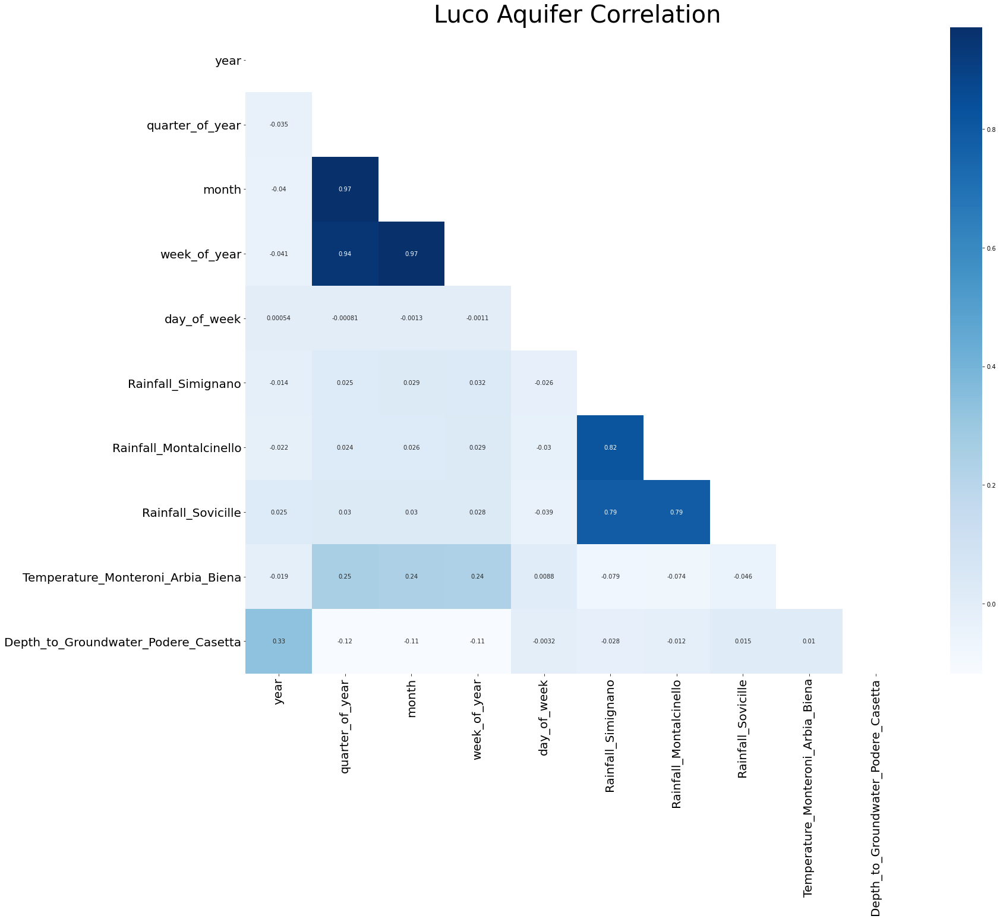

In [0]:
plt.figure(figsize=(25,20))
sns.heatmap(df_AqLuc.toPandas().corr(), cmap= 'Blues', mask = mask(df_AqLuc.toPandas()), annot=True, annot_kws= {'size':10})
plt.title('Luco Aquifer Correlation', {'size':40})
plt.yticks(fontsize=20)
plt.xticks(fontsize=20)# add loads of ticks

In [0]:
from statsmodels.tsa.seasonal import seasonal_decompose

def g(df):
    df.set_index('Date', inplace=True)
    for column in list(df.columns):
        decomp = seasonal_decompose(df[column], period=52, model='additive', extrapolate_trend='freq')
        df[f"{column}_trend"] = decomp.trend
        df[f"{column}_seasonal"] = decomp.seasonal

<command-630291055226580>:5: FutureWarning: the 'freq'' keyword is deprecated, use 'period' instead
  result = seasonal_decompose(df_AqLuc.toPandas()[j],freq=52,model='additive',extrapolate_trend='freq')


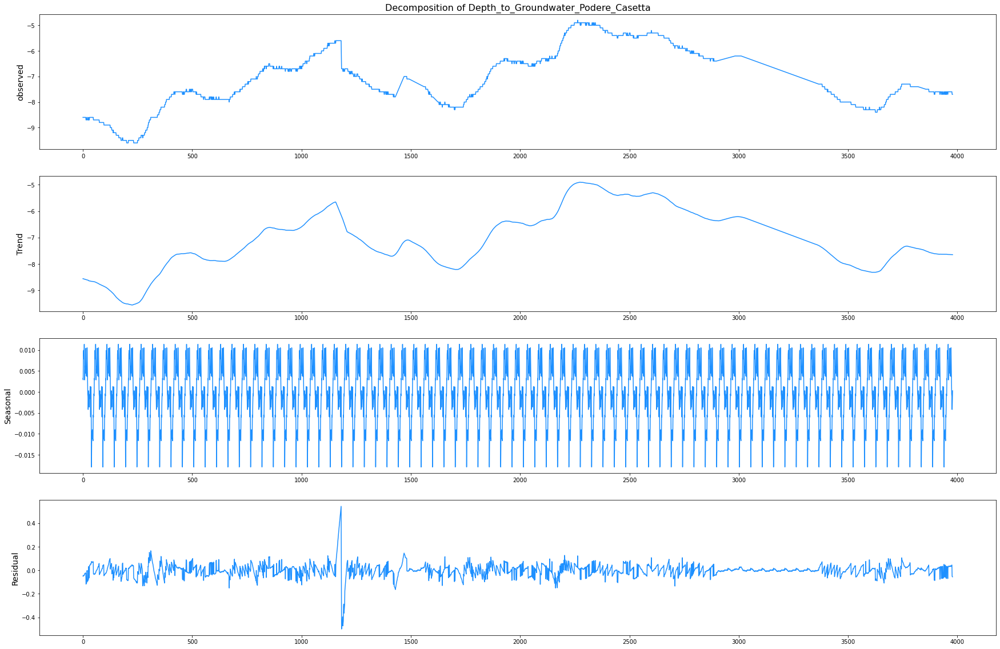

In [0]:
g(df_AqLuc.toPandas())

f,ax = plt.subplots(nrows=4,ncols=1,figsize=(30,20))
for i, j in enumerate(['Depth_to_Groundwater_Podere_Casetta']):
    result = seasonal_decompose(df_AqLuc.toPandas()[j],freq=52,model='additive',extrapolate_trend='freq')
    ax[0].set_title('Decomposition of {}'.format(j),fontsize=16)
    
    result.observed.plot(ax=ax[0], color='dodgerblue')
    ax[0].set_ylabel('observed',fontsize=14)
    
    result.trend.plot(ax=ax[1], color='dodgerblue')
    ax[1].set_ylabel('Trend', fontsize=14)
    
    result.seasonal.plot(ax=ax[2], color='dodgerblue')
    ax[2].set_ylabel('Seasonal', fontsize=14)
    
    result.resid.plot(ax=ax[3], color='dodgerblue')
    ax[3].set_ylabel('Residual', fontsize=14)

<a href=#cont> **Back to table of content**

### 8.2. Aquifer Petrignano EDA2

In [0]:
df_AqPet.show()

+----------+----+---------------+-----+------------+-----------+---------------------+------------------------+----------------------+---------------------+------------------------------------+------------------------+------------------------+
|      Date|year|quarter_of_year|month|week_of_year|day_of_week|Rainfall_Bastia_Umbra|Temperature_Bastia_Umbra|Temperature_Petrignano|Volume_C10_Petrignano|Hydrometry_Fiume_Chiascio_Petrignano|Depth_to_Groundwater_P24|Depth_to_Groundwater_P25|
+----------+----+---------------+-----+------------+-----------+---------------------+------------------------+----------------------+---------------------+------------------------------------+------------------------+------------------------+
|2006-03-14|2006|              1|    3|          11|          3|                  0.0|                     5.2|                   4.9|           -29281.824|                                 2.4|                  -22.48|                  -22.18|
|2006-03-15|2006|       

In [0]:
pd.DataFrame(AqPet.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5223 entries, 0 to 5222
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Date                                  5223 non-null   object 
 1   year                                  5223 non-null   int32  
 2   quarter_of_year                       5223 non-null   int32  
 3   month                                 5223 non-null   int32  
 4   week_of_year                          5223 non-null   int32  
 5   day_of_week                           5223 non-null   int32  
 6   Rainfall_Bastia_Umbra                 5223 non-null   float32
 7   Temperature_Bastia_Umbra              5223 non-null   float32
 8   Temperature_Petrignano                5223 non-null   float32
 9   Volume_C10_Petrignano                 5223 non-null   float32
 10  Hydrometry_Fiume_Chiascio_Petrignano  5223 non-null   float32
 11  Depth_to_Groundwa

""


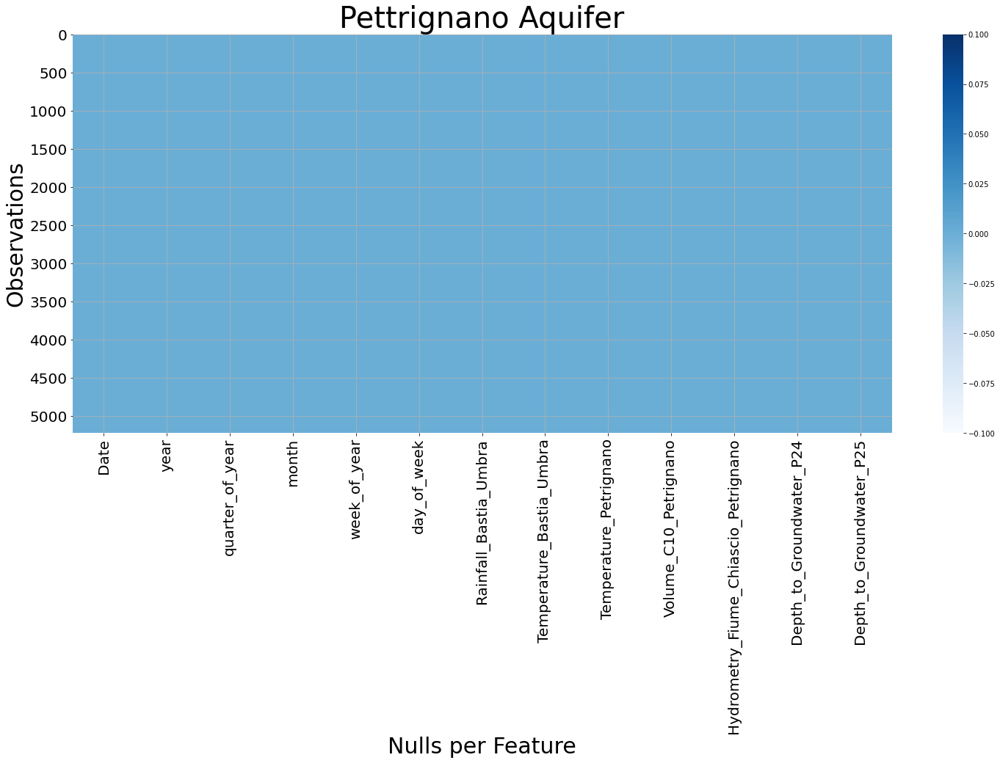

In [0]:
plt.figure(figsize=(25,10))
sns.heatmap(df_AqPet.toPandas().isnull(), cmap= 'Blues')
plt.title('Pettrignano Aquifer', {'size':40})
plt.xlabel('Nulls per Feature',{'size': 30})
plt.ylabel('Observations',{'size': 30})
plt.yticks(np.arange(0, 5200, 500), np.arange(0, 5200, 500), fontsize=20)
plt.xticks(fontsize=20)# add loads of ticks
plt.grid()

In [0]:
missing_data(AqPet)

,Total Missing,Percent
Date,0,0.0
year,0,0.0
quarter_of_year,0,0.0
month,0,0.0
week_of_year,0,0.0
day_of_week,0,0.0
Rainfall_Bastia_Umbra,0,0.0
Temperature_Bastia_Umbra,0,0.0
Temperature_Petrignano,0,0.0
Volume_C10_Petrignano,0,0.0


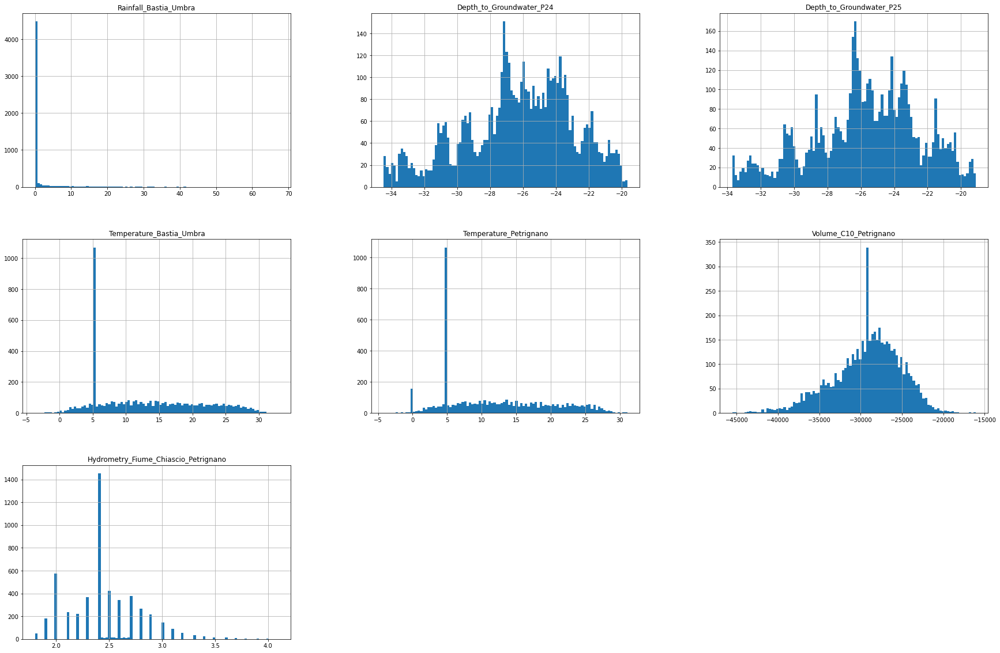

In [0]:
df_AqPet.toPandas()[['Rainfall_Bastia_Umbra',
 'Depth_to_Groundwater_P24',
 'Depth_to_Groundwater_P25',
 'Temperature_Bastia_Umbra',
 'Temperature_Petrignano',
 'Volume_C10_Petrignano',
 'Hydrometry_Fiume_Chiascio_Petrignano']].hist(figsize=(30,20), bins=100);

<command-1792384602560547>:5: FutureWarning: the 'freq'' keyword is deprecated, use 'period' instead
  result = seasonal_decompose(df_AqPet.toPandas()[j],freq=52,model='additive',extrapolate_trend='freq')


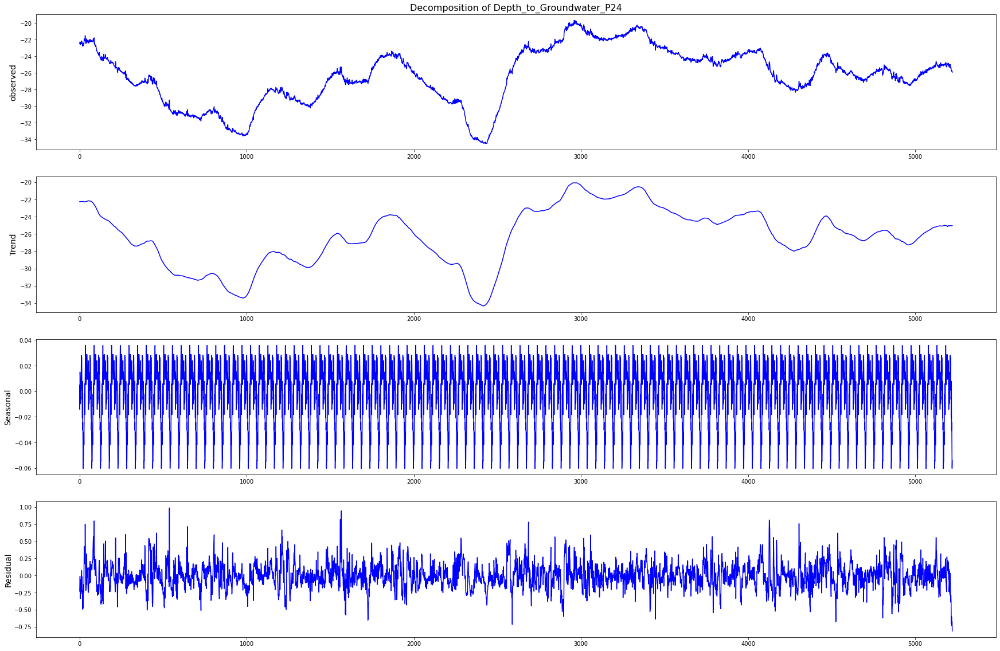

In [0]:
g(df_AqPet.toPandas())

f,ax = plt.subplots(nrows=4,ncols=1,figsize=(30,20))
for i, j in enumerate(['Depth_to_Groundwater_P24']):
    result = seasonal_decompose(df_AqPet.toPandas()[j],freq=52,model='additive',extrapolate_trend='freq')
    ax[0].set_title('Decomposition of {}'.format(j),fontsize=16)
    
    result.observed.plot(ax=ax[0], color='blue')
    ax[0].set_ylabel('observed',fontsize=14)
    
    result.trend.plot(ax=ax[1], color='blue')
    ax[1].set_ylabel('Trend', fontsize=14)
    
    result.seasonal.plot(ax=ax[2], color='blue')
    ax[2].set_ylabel('Seasonal', fontsize=14)
    
    result.resid.plot(ax=ax[3], color='blue')
    ax[3].set_ylabel('Residual', fontsize=14)

## 9. Final DataFrames

In [0]:
AqLuc = df_AqLuc.toPandas()
AqLuc.set_index('Date', inplace=True)

In [0]:
AqPet = df_AqPet.toPandas()
AqPet.set_index('Date', inplace=True)

<a href=#cont> **Back to table of content**

## 10. Model Architecture & Preprocessing

In [0]:
def X(df):
    
    from sklearn.preprocessing import RobustScaler
    import numpy as np
    scaler = RobustScaler()
    df = scaler.fit_transform(df)
    n_future = 1
    n_prec = 14
    X = []
    for i in range(n_prec, len(df)- n_future + 1):
        X.append(df[i - n_prec:i, 0:df.shape[1]])
    X = np.array(X)
    return X

In [0]:
def y(df,):
    from sklearn.preprocessing import RobustScaler
    import numpy as np
    scaler = RobustScaler()
    df = scaler.fit_transform(df)
    n_future = 1
    n_prec = 14
    y = []
    for i in range(n_prec, len(df)- n_future + 1):
        y.append(df[i + n_future -1: i+n_future, 0])
    y = np.array(y)
    return y 

---
---

### 10.1. LSTM Model

---
---

In [0]:
from sklearn.model_selection import train_test_split
from keras.models import Sequential
from keras.layers import Dense, LSTM, Conv1D, Conv2D, Dropout

In [0]:
def LSTM(df):
  
    from keras.models import Sequential
    from keras.layers import Dense, LSTM, Dropout
    X_train, X_test, y_train, y_test = train_test_split(X(df), y(df), test_size=0.4, random_state=42)
    
    model = Sequential()
    model.add(LSTM(8, activation='relu', return_sequences= True, input_shape=(X_train.shape[1], X_train.shape[2])))
    model.add(LSTM(16, activation='relu', return_sequences= True))
    model.add(LSTM(52, activation='relu', return_sequences= True))
    model.add(LSTM(16, activation='relu', return_sequences= True))
    model.add(LSTM(8, activation='relu', return_sequences= True))
    model.add(Dropout(0.2))
    model.add(Dense(y_train.shape[1], activation='relu'))
    model.compile(optimizer='adam', loss='mse')
    return model

---
---

### 10.2. CNN Model

---
---

In [0]:
def CNN(df):
    
    from keras.models import Sequential
    from keras.layers import Dense, Conv2D, Dropout, MaxPooling2D, Flatten
    X_train, X_test, y_train, y_test = train_test_split(X(df), y(df), test_size=0.4, random_state=42)
    
    model = Sequential()
    model.add(Conv2D(4, kernel_size=(3, 3), strides= (1,1), activation='relu', input_shape=(X_train.shape[1], X_train.shape[2], 1), padding = 'same'))
    model.add(MaxPooling2D(pool_size=(1,1)))
    
    model.add(Conv2D(16, kernel_size=(3, 3), strides= (1,1), activation='relu', padding = 'same'))
    model.add(MaxPooling2D(pool_size=(1,1)))
    
    model.add(Conv2D(50, kernel_size=(3, 3), activation='relu', padding = 'same'))
    model.add(MaxPooling2D(pool_size=(1,1)))
    
    model.add(Conv2D(16, kernel_size=(3, 3), activation='relu', padding = 'same'))
    model.add(MaxPooling2D(pool_size=(1,1)))
    
    model.add(Conv2D(4, kernel_size=(3, 3), activation='relu', padding = 'same'))
    model.add(MaxPooling2D(pool_size=(1,1)))
    
    model.add(Flatten())
    model.add(Dense(y_train.shape[1], activation='relu'))
    model.compile(optimizer='adam', loss='mse')
    return model

---
---

### 10.3. Dense Model

---
---

In [0]:
def Dense(df):
    
    from keras.models import Sequential
    from keras.layers import Dense, Dropout
    X_train, X_test, y_train, y_test = train_test_split(X(df), y(df), test_size=0.4, random_state=42)
    
    model = Sequential()
    model.add(Dense(4, activation='relu', input_shape=(X_train.shape[1], X_train.shape[2])))
    
    model.add(Dense(16, activation='relu'))
    model.add(Dense(50, activation='relu'))
    model.add(Dense(16, activation='relu'))
    model.add(Dense(4, activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(y_train.shape[1], activation='relu'))
    model.compile(optimizer='adam', loss='mse')
    return model

---
---

### 10.4. CNNLSTM Model

---
---

In [0]:
def Combo(df):
    
    from keras.models import Sequential
    from keras.layers import Dense, LSTM, Conv1D, Conv2D, ConvLSTM2D, Dropout, MaxPooling2D, Flatten
    X_train, X_test, y_train, y_test = train_test_split(X(df), y(df), test_size=0.4, random_state=42)
    
    model = Sequential()
    
    model.add(ConvLSTM2D(4, kernel_size=(5, 5), strides= (1,1), padding="same", return_sequences=True, activation="relu", go_backwards=True))
    model.add(ConvLSTM2D(16, kernel_size=(5, 5), strides= (1,1), padding="same", return_sequences=True, activation="relu", go_backwards=True))
    model.add(ConvLSTM2D(50, kernel_size=(5, 5), strides= (1,1), padding="same", return_sequences=True, activation="relu", go_backwards=True))
    model.add(ConvLSTM2D(16, kernel_size=(5, 5), strides= (1,1), padding="same", return_sequences=True, activation="relu", go_backwards=True))
    model.add(ConvLSTM2D(4, kernel_size=(5, 5), strides= (1,1), padding="same", return_sequences=True, activation="relu", go_backwards=True))
    model.add(Dropout(0.2))
    model.add(Dense(y_train.shape[1], activation='relu'))
    model.compile(optimizer='adam', loss='mse')
    return model

<a href=#cont> **Back to table of content**

##  11. Model Training

---
___

### 11.1. Training model with Luco Aquifer Data

---
---

In [0]:
X_train_AqLuc, X_test_AqLuc, y_train_AqLuc, y_test_AqLuc = train_test_split(X(AqLuc), y(AqLuc), test_size=0.33, random_state=42)

In [0]:
LSTM(AqLuc).summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_15 (LSTM)              (None, 14, 8)             608       
                                                                 
 lstm_16 (LSTM)              (None, 14, 16)            1600      
                                                                 
 lstm_17 (LSTM)              (None, 14, 52)            14352     
                                                                 
 lstm_18 (LSTM)              (None, 14, 16)            4416      
                                                                 
 lstm_19 (LSTM)              (None, 14, 8)             800       
                                                                 
 dropout_3 (Dropout)         (None, 14, 8)             0         
                                                                 
 dense_3 (Dense)             (None, 14, 1)            

In [0]:
LSTM_AqLuc = LSTM(AqLuc).fit(X_train_AqLuc, y_train_AqLuc, epochs=10, batch_size= 10, validation_split= 0.4, verbose=1)

Epoch 1/10
160/160 [==============================] - 12s 39ms/step - loss: 0.2594 - val_loss: 0.2484
Epoch 2/10
160/160 [==============================] - 6s 35ms/step - loss: 0.2022 - val_loss: 0.1830
Epoch 3/10
 50/160 [======

*** WARNING: max output size exceeded, skipping output. ***

160/160 [==============================] - 6s 35ms/step - loss: 0.1325 - val_loss: 0.1330
Epoch 9/10
160/160 [==============================] - 6s 35ms/step - loss: 0.1308 - val_loss: 0.1319
Epoch 10/10
160/160 [==============================] - 6s 35ms/step - loss: 0.1295 - val_loss: 0.1319


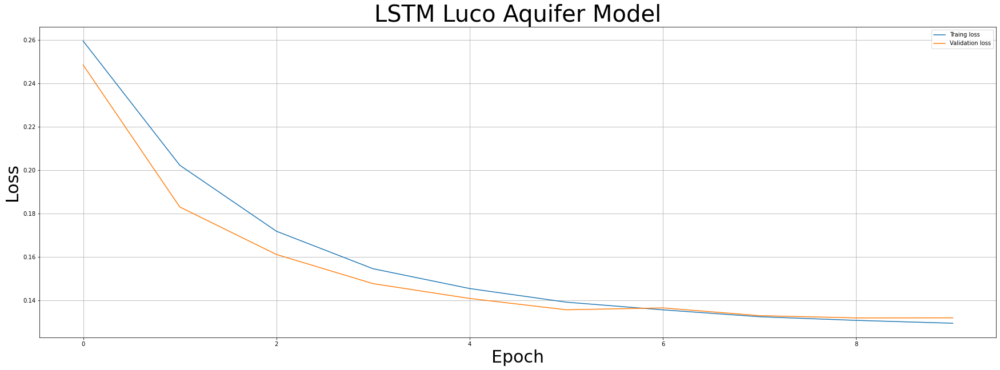

In [0]:
plt.figure(figsize=(30,10))
plt.plot(LSTM_AqLuc.history['loss'], label= 'Traing loss')
plt.plot(LSTM_AqLuc.history['val_loss'], label= 'Validation loss')
plt.legend()

plt.xlabel('Epoch',{'size': 30})
plt.ylabel('Loss',{'size': 30})
plt.title('LSTM Luco Aquifer Model', {'size':40})
plt.grid()

In [0]:
CNN(AqLuc).summary()

Model: "sequential_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_36 (Conv2D)          (None, 14, 10, 4)         40        
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 14, 10, 4)        0         
 2D)                                                             
                                                                 
 conv2d_37 (Conv2D)          (None, 14, 10, 16)        592       
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 14, 10, 16)       0         
 2D)                                                             
                                                                 
 conv2d_38 (Conv2D)          (None, 14, 10, 50)        7250      
                                                                 
 max_pooling2d_7 (MaxPooling  (None, 14, 10, 50)     

In [0]:
CNN_AqLuc = CNN(AqLuc).fit(X_train_AqLuc, y_train_AqLuc, epochs=10, batch_size= 10, validation_split= 0.4, verbose=1)

Epoch 1/10
160/160 [==============================] - 4s 19ms/step - loss: 0.2629 - val_loss: 0.2662
Epoch 2/10
160/160 [==============================] - 3s 16ms/step - loss: 0.2048 - val_loss: 0.1319
Epoch 3/10
160/160 [==============================] - 3s 16ms/step - loss: 0.1249 - val_loss: 0.1276
Epoch 4/10
160/160 [==============================] - 3s 16ms/step - loss: 0.1228 - val_loss: 0.1272
Epoch 5/10
160/160 [==============================] - 2s 15ms/step - loss: 0.1226 - val_loss: 0.1269
Epoch 6/10
160/160 [==============================] - 3s 16ms/step - loss: 0.1223 - val_loss: 0.1270
Epoch 7/10
160/160 [==============================] - 3s 16ms/step - loss: 0.1223 - val_loss: 0.1270
Epoch 8/10
160/160 [==============================] - 3s 16ms/step - loss: 0.1222 - val_loss: 0.1268
Epoch 9/10
160/160 [==============================] - 3s 16ms/step - loss: 0.1223 - val_loss: 0.1270
Epoch 10/10
160/160 [==============================] - 2s 15ms/step - loss: 0.1222 - val_lo

Out[107]: <matplotlib.legend.Legend at 0x7f83844ba820>

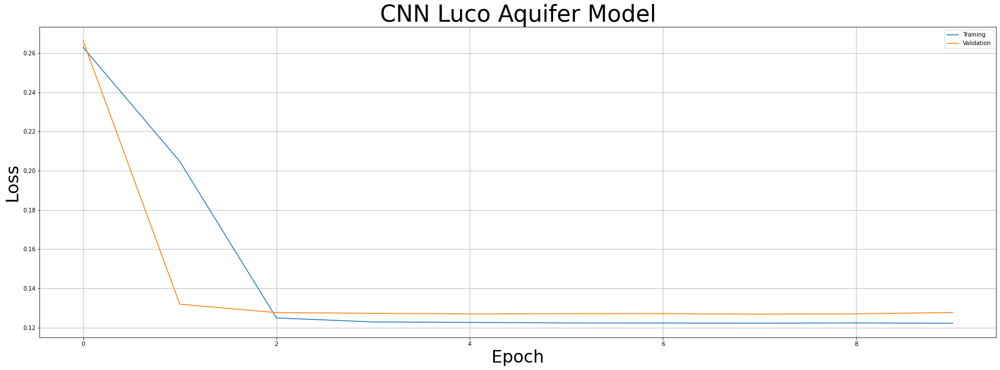

In [0]:
plt.figure(figsize=(30,10))
plt.plot(CNN_AqLuc.history['loss'], label= 'Training')
plt.plot(CNN_AqLuc.history['val_loss'], label= 'Validation')


plt.xlabel('Epoch',{'size': 30})
plt.ylabel('Loss',{'size': 30})
plt.title('CNN Luco Aquifer Model', {'size':40})
plt.grid()
plt.legend()

In [0]:
Dense(AqLuc).summary()

Model: "sequential_16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_13 (Dense)            (None, 14, 4)             44        
                                                                 
 dense_14 (Dense)            (None, 14, 16)            80        
                                                                 
 dense_15 (Dense)            (None, 14, 50)            850       
                                                                 
 dense_16 (Dense)            (None, 14, 16)            816       
                                                                 
 dense_17 (Dense)            (None, 14, 4)             68        
                                                                 
 dropout_11 (Dropout)        (None, 14, 4)             0         
                                                                 
 dense_18 (Dense)            (None, 14, 1)           

In [0]:
Dense_AqLuc = Dense(AqLuc).fit(X_train_AqLuc, y_train_AqLuc, epochs=10, batch_size= 10, validation_split= 0.4, verbose=1)

Epoch 1/10
160/160 [==============================] - 2s 5ms/step - loss: 0.2586 - val_loss: 0.2615
Epoch 2/10
160/160 [==============================] - 0s 3ms/step - loss: 0.2270 - val_loss: 0.1960
Epoch 3/10
160/160 [==============================] - 0s 3ms/step - loss: 0.1855 - val_loss: 0.1708
Epoch 4/10
160/160 [==============================] - 0s 3ms/step - loss: 0.1642 - val_loss: 0.1469
Epoch 5/10
160/160 [==============================] - 0s 3ms/step - loss: 0.1451 - val_loss: 0.1363
Epoch 6/10
160/160 [==============================] - 0s 3ms/step - loss: 0.1419 - val_loss: 0.1306
Epoch 7/10
160/160 [==============================] - 0s 3ms/step - loss: 0.1397 - val_loss: 0.1298
Epoch 8/10
160/160 [==============================] - 0s 3ms/step - loss: 0.1402 - val_loss: 0.1284
Epoch 9/10
160/160 [==============================] - 1s 4ms/step - loss: 0.1389 - val_loss: 0.1283
Epoch 10/10
160/160 [==============================] - 0s 3ms/step - loss: 0.1384 - val_loss: 0.1290

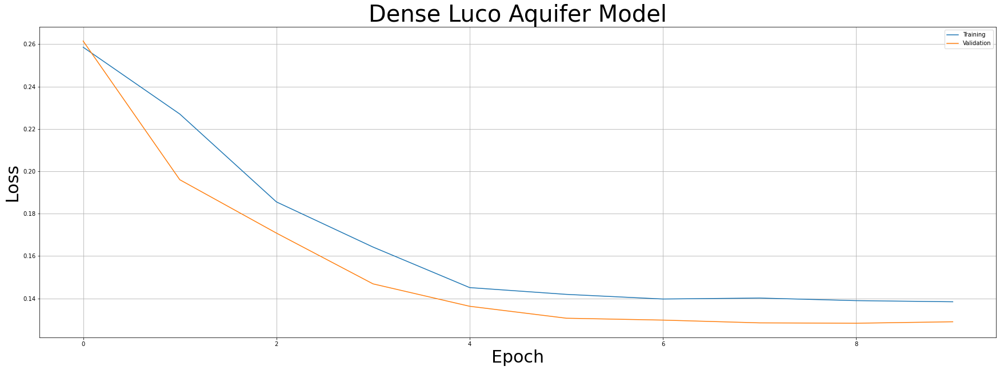

In [0]:
plt.figure(figsize=(30,10))
plt.plot(Dense_AqLuc.history['loss'], label= 'Training')
plt.plot(Dense_AqLuc.history['val_loss'], label= 'Validation')
plt.legend()

plt.xlabel('Epoch',{'size': 30})
plt.ylabel('Loss',{'size': 30})
plt.title('Dense Luco Aquifer Model', {'size':40})
plt.grid()

In [0]:
Combo(AqLuc).summary()

---------------------------------------------------------------------------
ValueError                                Traceback (most recent call last)
<command-3472225599321673> in <module>
----> 1 Combo(AqLuc).summary()

/databricks/python/lib/python3.8/site-packages/keras/engine/training.py in summary(self, line_length, positions, print_fn, expand_nested, show_trainable)
   2773     """
   2774     if not self.built:
-> 2775       raise ValueError(
   2776           'This model has not yet been built. '
   2777           'Build the model first by calling `build()` or by calling '

ValueError: This model has not yet been built. Build the model first by calling `build()` or by calling the model on a batch of data.

<a href=#cont> **Back to table of content**

---
---

### 11.2. Training model with Petrignano Aquifer Data

<a href=#cont> **Back to table of content**

---
---

## 12. Hyperparameter Tuning

---
---

### 12.1. Hyperparameter Tune AqLuc Models

---
---

<a href=#cont> **Back to table of content**

---
---

### 12.2. Hyperparameter Tune Petrignano Models

---
---

<a href=#cont> **Back to table of content**

## Model Predictions

---
___

###Model Pediction with Luco Aquifer Data

---
___

In [0]:
LSTM_Luco_pred= LSTM(AqLuc).predict(X_test_AqLuc)

In [0]:
LSTM_Luco_pred.shape

Out[158]: (1309, 14, 1)

In [0]:
LSTM_Luco_pred = np.reshape(LSTM_Luco_pred.shape[0],LSTM_Luco_pred.shape[1])

---------------------------------------------------------------------------
ValueError                                Traceback (most recent call last)
<command-3991231029929276> in <module>
----> 1 LSTM_Luco_pred = np.reshape(LSTM_Luco_pred.shape[0],LSTM_Luco_pred.shape[1])

<__array_function__ internals> in reshape(*args, **kwargs)

/databricks/python/lib/python3.8/site-packages/numpy/core/fromnumeric.py in reshape(a, newshape, order)
    297            [5, 6]])
    298     """
--> 299     return _wrapfunc(a, 'reshape', newshape, order=order)
    300 
    301 

/databricks/python/lib/python3.8/site-packages/numpy/core/fromnumeric.py in _wrapfunc(obj, method, *args, **kwds)
     53     bound = getattr(obj, method, None)
     54     if bound is None:
---> 55         return _wrapit(obj, method, *args, **kwds)
     56 
     57     try:

/databricks/python/lib/python3.8/site-packages/numpy/core/fromnumeric.py in _wrapit(obj, method, *args, **kwds)
     42     except AttributeError:
     4

In [0]:
from sklearn.metrics import mean_squared_error
mean_squared_error(y_test_AqLuc[0], LSTM_Luco_pred[0])

---------------------------------------------------------------------------
ValueError                                Traceback (most recent call last)
<command-3991231029929277> in <module>
      1 from sklearn.metrics import mean_squared_error
----> 2 mean_squared_error(y_test_AqLuc[0], LSTM_Luco_pred[0])

/databricks/python/lib/python3.8/site-packages/sklearn/utils/validation.py in inner_f(*args, **kwargs)
     61             extra_args = len(args) - len(all_args)
     62             if extra_args <= 0:
---> 63                 return f(*args, **kwargs)
     64 
     65             # extra_args > 0

/databricks/python/lib/python3.8/site-packages/sklearn/metrics/_regression.py in mean_squared_error(y_true, y_pred, sample_weight, multioutput, squared)
    333     0.825...
    334     """
--> 335     y_type, y_true, y_pred, multioutput = _check_reg_targets(
    336         y_true, y_pred, multioutput)
    337     check_consistent_length(y_true, y_pred, sample_weight)

/databricks/python

In [0]:
y_test_AqLuc[0]

Out[157]: array([-0.83333333])

In [0]:
y_test_AqLuc.shape[0]

Out[159]: 1309

In [0]:
pd.DataFrame(LSTM_Luco_pred[0])

,0
0,0.000001
1,0.000005
2,0.000015
3,0.000038
4,0.000072
5,0.000112
6,0.000169
7,0.000236
8,0.000322
9,0.000465


In [0]:
pd.DataFrame(LSTM_Luco_pred[1])

,0
0,0.000001
1,0.000006
2,0.000192
3,0.000598
4,0.001120
5,0.001592
6,0.001950
7,0.002206
8,0.002523
9,0.002868
